In [1]:
import os

import numpy as np
import pandas as pd
import seaborn as sns
import pymc3 as pm

from sklearn.metrics import confusion_matrix as conf_mat

%pylab inline
%config InlineBackend.figure_format = 'retina'
%qtconsole --colors=linux
%load_ext watermark

Populating the interactive namespace from numpy and matplotlib


In [2]:
%watermark -v -m -p numpy,pandas,seaborn,pymc3,matplotlib

CPython 3.5.1
IPython 6.0.0

numpy 1.12.0
pandas 0.20.1
seaborn 0.7.0
pymc3 3.1rc3
matplotlib 2.0.2

compiler   : GCC 4.2.1 (Apple Inc. build 5666) (dot 3)
system     : Darwin
release    : 16.5.0
machine    : x86_64
processor  : i386
CPU cores  : 4
interpreter: 64bit


# Table of Content
[Abstract](#Abstract)  
[Experiment info](#Experiment-information-snippet)  

Load data
- [Display one subject](#Display-one-subject)  
- [Load all data](#Load-all-subject)  
- [Data filtering](#Data-Filtering)  

[Descriptive result](#Display-descriptive-result-by-age-group)  
- [Confusion Matrix](#mean-confusion-matrix)  
- [Expression recognition as the function of age](#Lineplot-of-accurate-recognition-as-a-function-of-age)  
- [Dynamic advantage](#Dynamic-advantage-as-a-function-of-age)  

[GP](#Gaussian-Process-alike)  

[Piece-wise regression model](#Facial-expression-recognition-as-a-function-of-age)  
- [Setup helper function for PyMC3](#Setup-helper-function-for-PyMC3)  
    model zoo
- [Bayesian model 1](#Model-1---Naive-model:)  
- [Bayesian model 2](#Model-2---logistic-regression:)  
- [Bayesian model 2 - both task](#Model-2-for-both-dynamic-and-static)  
- [Bayesian model 3](#Model-3)  
- [Bayesian model 3 - both task](#Model-3-for-both-dynamic-and-static)

Final   
- [Anger](#Anger)  
- [Disgust](#Disgust)  
- [Fear](#Fear)  
- [Happy](#Happy)  
- [Sad](#Sad)    
- [Surprise](#Surprise)  

[Frequentist fit](#Frequentist-fit)

# Tracking the recognition of static and dynamic facial expressions of emotion across life span

Anne-Raphaëlle Richoz<sup>1</sup>, Junpeng Lao<sup>1</sup>, Olivier Pascalis<sup>2</sup>, and Roberto Caldara<sup>1</sup>  
*<sup>1</sup>Eye and Brain Mapping Laboratory (iBMLab), Department of Psychology, University of Fribourg, Fribourg, Switzerland*  
*<sup>2</sup>Laboratoire de Psychologie et Neurocognition (CNRS), Université Grenoble-Alpes, Grenoble, France*


## Abstract  
Dynamic social signals are steadily stimulating the visual system during human interactions. A wealth of such signals are transmitted as facial expressions for communicating internal emotional states. Unlike static snapshots, routinely used in most of the experiments, dynamic facial expressions provide observers with richer and ecologically-valid signals. Common intuition would thus suggest an advantage for the recognition of dynamic over static inputs. However, while many studies reported an advantage in the recognition of dynamic over static expressions in clinical populations ([Richoz et al., 2015](http://perso.unifr.ch/roberto.caldara/pdfs/richoz_15.pdf)), results obtained with healthy young adults are by far more contrasted. To clarify this issue, we conducted a large sample cross-sectional study to investigate facial expression recognition from early to elderly age. Over 400 observers (age range 5-100) performed recognition tasks of the six basic expressions in three conditions: static, shuffled (temporally randomized frames) and dynamic ([Gold et al., 2013](https://dx.doi.org/10.1167%2F13.5.23)). We normalized the stimuli for their low-level properties and the amount of energy sampled over time, even for the static condition. Facial expression recognition profiles revealed a better performance for “happy” and typical confusions among expressions with similar morphology (fear-surprise), regardless of condition and age. We then applied a Generalized Additive Model with smoothing spline on an efficiency index to capture the nonlinear relationship between age and the experimental conditions. Overall, we observed strong efficiency in the recognition of dynamic facial expressions in the elderly population. This observation was driven by a suboptimal performance for static and shuffled expressions, a potential marker for impaired face processing that might be linked to other facets of general cognitive decline. Our findings also posit the use of dynamic stimuli as being critical in the assessment of facial expression recognition in elderly populations, inviting to caution when drawing conclusions from the sole use of static face images to this aim.

## Experiment information snippet

### Experiment setup
Participant perform 3 different task [Dynamic,Shuffl,Static], each with 96 trials (2 sex x 6 expression x 4 identities x 2 repetition)

### Stimuli (static)

![fig1](figs/img1.jpg)

## Display one subject

In [3]:
# import os
proj_path = '/Users/jlao/Documents/Github/Static_dynamic'
datatmp = pd.read_csv(proj_path + '/data/CHuguet_g1_a9_DyExp_beh.txt','\t',
                      header=None)
# change column name
column_name = ['Trial','Resp','ACC','RT','cRect1','cRect2','cRect3','cRect4',
               'Randseq','Task']
datatmp.columns=column_name
# change stimuli name
stim_list = pd.read_csv(proj_path + '/experiment_code/stimuli_list.csv',',')
datatmp['Expression'] = np.asarray(stim_list['Expression'].loc[datatmp['Randseq']-1])
# change response name
resp_list = np.asarray(['Fear','Anger','Disgust','Happiness','Sadness','Surprise'])
Resp = []
for iresp in datatmp['Resp']:
    if np.isfinite(iresp):
        Resp.append(resp_list[int(iresp-1)])
    else:
        Resp.append(np.nan)
datatmp['Resp_Exp'] = np.asarray(Resp)
# change task name
Taskname = np.asarray(['Dynamic','Shuffled','Static'])
datatmp['Task_nam'] = Taskname[datatmp['Task']-1]
# show dataframe (first 5 lines)
datatmp.head(5)

,Trial,Resp,ACC,RT,cRect1,cRect2,cRect3,cRect4,Randseq,Task,Expression,Resp_Exp,Task_nam
0,1,3.0,1.0,3.469837,340.5176,70.51765,1099.482,829.4824,64,1,Disgust,Disgust,Dynamic
1,2,5.0,0.0,1.791639,340.5176,70.51765,1099.482,829.4824,12,1,Disgust,Sadness,Dynamic
2,3,2.0,0.0,4.039435,340.5176,70.51765,1099.482,829.4824,13,1,Disgust,Anger,Dynamic
3,4,5.0,1.0,4.190567,340.5176,70.51765,1099.482,829.4824,87,1,Sadness,Sadness,Dynamic
4,5,2.0,1.0,1.299397,340.5176,70.51765,1099.482,829.4824,54,1,Anger,Anger,Dynamic


In [4]:
taskorder = datatmp.Task.unique() - 1
print('The task order is:' + str(taskorder))

from sklearn.metrics import confusion_matrix as conf_mat
labellist = np.asarray(['Anger','Disgust','Fear','Happiness','Sadness','Surprise'])
for ij,itask in enumerate(Taskname):
    datatask  = datatmp[datatmp['Task_nam']==itask]
    conf_subj = conf_mat(datatask['Expression'],datatask['Resp_Exp'],labels=labellist)
    conf_df = pd.DataFrame(conf_subj,columns=labellist,index=labellist)
    conf_df['trials']=datatask['Expression'].value_counts()
    print('\n'+itask)
    print(conf_df)

The task order is:[0 2 1]

Dynamic
           Anger  Disgust  Fear  Happiness  Sadness  Surprise  trials
Anger          9        3     2          0        2         0      16
Disgust        6        5     2          0        3         0      16
Fear           0        1     3          0        3         8      16
Happiness      0        0     0         16        0         0      16
Sadness        2        2     0          0       11         1      16
Surprise       0        0     0          2        0        14      16

Shuffled
           Anger  Disgust  Fear  Happiness  Sadness  Surprise  trials
Anger         12        3     0          0        1         0      16
Disgust        9        4     2          0        0         0      16
Fear           1        3     5          0        1         6      16
Happiness      0        0     0         14        0         0      16
Sadness        3        1     2          0        7         1      16
Surprise       0        1     2          4   

Define a function for loading each subject.

In [5]:
from sklearn.metrics import confusion_matrix as conf_mat

def loadsbj(filepath,labellist,column_name,stim_list,Taskname):
    datatmp = pd.read_csv(filepath,'\t',
                          header=None)
    # change column name
    datatmp.columns=column_name
    # change stimuli name
    datatmp['Expression'] = np.asarray(stim_list['Expression'].loc[datatmp['Randseq']-1])
    # change response name
    Resp = []
    for iresp in datatmp['Resp']:
        if np.isfinite(iresp):
            Resp.append(resp_list[int(iresp-1)])
        else:
            Resp.append(np.nan)
    datatmp['Resp_Exp'] = np.asarray(Resp)
    # change task name
    datatmp['Task_nam'] = Taskname[datatmp['Task']-1]
    taskorder = datatmp.Task.unique() - 1
    conf_all = np.zeros((3,len(labellist),len(labellist)+1))
    for ij,itask in enumerate(Taskname):
        datatask  = datatmp[datatmp['Task_nam']==itask]
        if datatask.shape[0]>0:
            conf_subj = conf_mat(datatask['Expression'],datatask['Resp_Exp'],labels=labellist)
            conf_df = pd.DataFrame(conf_subj,columns=labellist,index=labellist)
            conf_df['trials']=datatask['Expression'].value_counts()
            conf_all[ij]=np.asarray(conf_df)
        
    return taskorder,np.asarray(conf_all)

Taskname = np.asarray(['Dynamic','Shuffled','Static'])
resp_list = np.asarray(['Fear','Anger','Disgust','Happiness','Sadness','Surprise'])
column_name = ['Trial','Resp','ACC','RT','cRect1','cRect2','cRect3','cRect4',
                   'Randseq','Task']
stim_list = pd.read_csv(proj_path + '/experiment_code/stimuli_list.csv',',')
labellist = np.asarray(['Anger','Disgust','Fear','Happiness','Sadness','Surprise'])

filepath = proj_path + '/data/CHuguet_g1_a9_DyExp_beh.txt'
taskorder,conf_all = loadsbj(filepath,labellist,column_name,stim_list,Taskname)
print(taskorder)
print(conf_all)

[0 2 1]
[[[  9.   3.   2.   0.   2.   0.  16.]
  [  6.   5.   2.   0.   3.   0.  16.]
  [  0.   1.   3.   0.   3.   8.  16.]
  [  0.   0.   0.  16.   0.   0.  16.]
  [  2.   2.   0.   0.  11.   1.  16.]
  [  0.   0.   0.   2.   0.  14.  16.]]

 [[ 12.   3.   0.   0.   1.   0.  16.]
  [  9.   4.   2.   0.   0.   0.  16.]
  [  1.   3.   5.   0.   1.   6.  16.]
  [  0.   0.   0.  14.   0.   0.  16.]
  [  3.   1.   2.   0.   7.   1.  16.]
  [  0.   1.   2.   4.   0.   8.  16.]]

 [[ 11.   3.   0.   0.   2.   0.  16.]
  [  5.   8.   2.   0.   1.   0.  16.]
  [  4.   2.   3.   0.   1.   6.  16.]
  [  0.   0.   0.  15.   0.   0.  16.]
  [  3.   1.   1.   0.   8.   2.  16.]
  [  0.   0.   0.   4.   0.  12.  16.]]]


# Load all subject

In [6]:
import os
Sbjall_txt = os.listdir(proj_path+'/data/')
gender = []
age = []
sbjname = []
confusionall = []
taskorderall = []
for string in Sbjall_txt:
    info = string.split(sep='_')
    gender.append(int(info[1][1:]))
    age.append(int(info[2][1:]))
    sbjname.append(info[0])
    filepath = proj_path + '/data/' + string
    taskorder,conf_all = loadsbj(filepath,labellist,column_name,stim_list,Taskname)
    confusionall.append(conf_all)
    taskorderall.append(taskorder)

In [7]:
subject_info = pd.DataFrame({'name': sbjname, 'gender': gender, 'age': age, 'taskorder':taskorderall})
confusionall = np.asarray(confusionall)
print(subject_info.head(5))
print(confusionall.shape)
print(subject_info.shape)

   age  gender        name  taskorder
0   61       2  AAltobelli  [2, 0, 1]
1   19       1    AAndrade  [0, 2, 1]
2    5       1    ABanchet  [2, 0, 1]
3   90       1     ABerger  [0, 2, 1]
4   57       1     ABiston  [0, 2, 1]
(444, 3, 6, 7)
(444, 4)


# Data Filtering
There are some subject that did not answer one expression on the first task. Because we do not know whether they actually did not perceive that expression or did not understand the task, we excluded these subjects from the analysis.  
If subjects did not answer one expression on the second or third task, but did so on the first one, they were included in the analysis as we assumed they understood correctly the instructions.  

In [8]:
nsbj = subject_info.shape[0]
subject_info['exclude'] = np.zeros(nsbj)
for isbj, taskorder, confmat in zip(range(nsbj),subject_info['taskorder'],confusionall):
    emptyresp = np.where(np.sum(confmat[taskorder[0]],axis=0)[:6]==0)
    if emptyresp[0].size!=0:
        print('Sbj ' +str(isbj) + ' missing expression ' + str(labellist[emptyresp[0]]))
        subject_info.loc[isbj,('exclude')]=1

Sbj 10 missing expression ['Fear']
Sbj 36 missing expression ['Surprise']
Sbj 40 missing expression ['Disgust']
Sbj 50 missing expression ['Disgust']
Sbj 60 missing expression ['Fear']
Sbj 110 missing expression ['Surprise']
Sbj 135 missing expression ['Fear']
Sbj 144 missing expression ['Surprise']
Sbj 148 missing expression ['Fear']
Sbj 161 missing expression ['Fear']
Sbj 171 missing expression ['Fear']
Sbj 175 missing expression ['Disgust']
Sbj 181 missing expression ['Anger']
Sbj 191 missing expression ['Fear']
Sbj 215 missing expression ['Fear']
Sbj 234 missing expression ['Fear']
Sbj 252 missing expression ['Sadness']
Sbj 254 missing expression ['Surprise']
Sbj 258 missing expression ['Fear']
Sbj 269 missing expression ['Fear']
Sbj 282 missing expression ['Anger']
Sbj 293 missing expression ['Fear']
Sbj 297 missing expression ['Fear']
Sbj 298 missing expression ['Disgust']
Sbj 308 missing expression ['Surprise']
Sbj 326 missing expression ['Surprise']
Sbj 329 missing expression [

Output desciptive table for the valid subject

In [9]:
# print(subject_info.loc[subject_info['exclude']==1])
include = subject_info['exclude']==0
Info_tbl = pd.DataFrame.copy(subject_info.loc[include]).reset_index()
Conf_mat = confusionall[include,:,:,:]
gendervec = np.asarray(Info_tbl['gender']) - 1
Info_tbl['gender'] = pd.Categorical.from_codes(gendervec, categories=["female", "male"])

print('The total sample size is: '+ str(Info_tbl.shape[0]))
bins = [4, 6, 8, 10, 12, 14, 16, 18, 20, 30, 40, 50, 60, 70, 80, 100]
group_names = ['a05-06', 'a07-08', 'a09-10', 'a11-12', 'a13-14', 'a15-16',
               'a17-18', 'a19-20', 'a21-30', 'a31-40', 'a41-50', 'a51-60',
               'a61-70', 'a71-80', 'a81-99']
group_order = np.arange(0,len(bins)-1)
Info_tbl['age_group'] = pd.cut(Info_tbl['age'], bins, labels=group_names)
Info_tbl['age_group2'] = pd.cut(Info_tbl['age'], bins, labels=group_order)
Info_tbl['age_mean'] = np.zeros((len(Info_tbl)))
for iage in Info_tbl['age_group'].unique():
    idex = Info_tbl['age_group']==iage
    Info_tbl.loc[idex,('age_mean')] = np.mean(Info_tbl['age'][idex])

print('\nNumber of subject per age group:')
Descriptive1 = pd.DataFrame({'Num_sbj':Info_tbl.groupby(['age_group']).size()}).reset_index()
print(Descriptive1)
Descriptive2 = pd.DataFrame({'Num_sbj':Info_tbl.groupby(['age_group','gender']).size()}).reset_index()
print('\nNumber of subject per age group (by gender):')
print(Descriptive2)

The total sample size is: 412

Number of subject per age group:
   age_group  Num_sbj
0     a05-06       27
1     a07-08       24
2     a09-10       22
3     a11-12       22
4     a13-14       24
5     a15-16       21
6     a17-18       21
7     a19-20       31
8     a21-30       31
9     a31-40       23
10    a41-50       33
11    a51-60       30
12    a61-70       32
13    a71-80       31
14    a81-99       40

Number of subject per age group (by gender):
   age_group  gender  Num_sbj
0     a05-06  female       17
1     a05-06    male       10
2     a07-08  female       17
3     a07-08    male        7
4     a09-10  female       11
5     a09-10    male       11
6     a11-12  female       14
7     a11-12    male        8
8     a13-14  female       10
9     a13-14    male       14
10    a15-16  female        8
11    a15-16    male       13
12    a17-18  female       16
13    a17-18    male        5
14    a19-20  female       27
15    a19-20    male        4
16    a21-30  female       2

# Display descriptive result by age group
### mean confusion matrix

In [10]:
import seaborn as sns
exp_list  = np.asarray(['Anger','Disgust','Fear','Happy','Sad','Surprise'])
resp_list = np.asarray(['Anger','Disgust','Fear','Happy','Sad','Surprise','Null'])
Tasksel = ['Dynamic', 'Static', 'Shuffled']

In [11]:
from matplotlib.animation import FuncAnimation
from matplotlib import animation, rc
# equivalent to rcParams['animation.html'] = 'html5'
rc('animation', html='html5')


meanall = np.zeros((6,7,len(group_names)+2,3))
agerange = np.asarray([0,5,7,9,11,13,15,17,19,21,31,41,51,61,71,81,100])
for ik, (iage, tblage) in enumerate(Info_tbl.groupby('age_group')):
    Conftmp = Conf_mat[tblage.index,:,:,:6]
    Conftrl = Conf_mat[tblage.index,:,:,6]
    tmp = Conftrl-np.sum(Conftmp,axis=3)
    Conftmp2 = np.concatenate((Conftmp,np.expand_dims(tmp,axis=3)),axis=3)
    trialnum = np.reshape(np.repeat(Conftrl,7,axis=2),newshape=Conftmp2.shape)
    Confgroup = Conftmp2/trialnum
    for ij,itask in enumerate(Tasksel):
        idx = np.where(Taskname == itask)[0][0]
        mattmp  = Confgroup[:,idx,:,:]
        meanmat = np.mean(mattmp[np.isfinite(mattmp[:,0,0]),:,:],axis=0)
        meanall[:,:,ik+1,ij] = meanmat

    
nframe = meanall.shape[2]
nif = 10
meanall2 = np.zeros((6,7,nframe*nif,3))
agerange2 = np.zeros((nframe*nif))
for ik in range(1,nframe):
    agerange2[np.arange(nif*(ik-1),nif*ik)] = np.linspace(agerange[ik-1], 
                                                          agerange[ik] , nif+1)[:-1]
    for ij in range(3):
        for ix in range(6):
            for iy in range(7):
                meanall2[ix, iy, np.arange(nif*(ik-1),nif*ik),ij] = np.linspace(meanall[ix, iy, ik-1, ij], 
                                                                                meanall[ix, iy, ik, ij] , nif+1)[:-1]
                

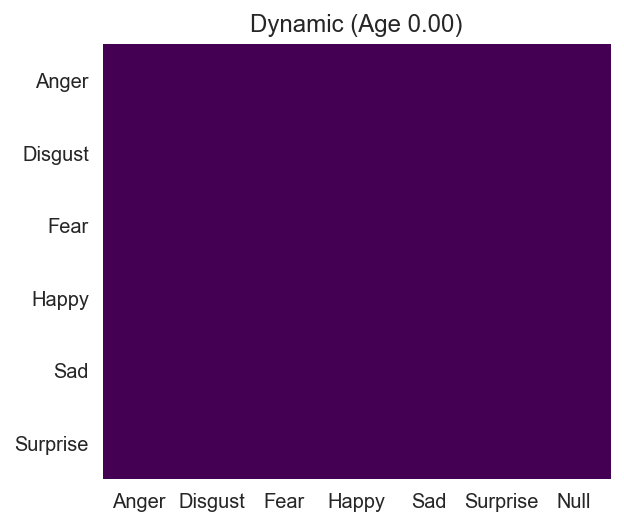

In [12]:
#### Plotting #####
tasksel = 0
fig = plt.figure()
im = plt.imshow(meanall2[:,:,10,tasksel], imlim=[0, .95], cmap='viridis', animated=True)
plt.grid('off')
plt.xticks(np.arange(len(resp_list)), resp_list)
plt.yticks(np.arange(len(exp_list)), exp_list)
title = plt.title("")

def updatefig(t):
    im.set_array(meanall2[:,:,t,tasksel])
    title.set_text(Tasksel[tasksel] + ' (Age %.2f)' %(agerange2[t]))
    return im, title

nframe = meanall2.shape[2]
ani = matplotlib.animation.FuncAnimation(fig, func=updatefig, frames=nframe, blit=True,
                       interval=1000/nif/4, repeat_delay=1000)
ani

In [13]:
ani.save('dynamic_confmat.mp4',dpi=300)

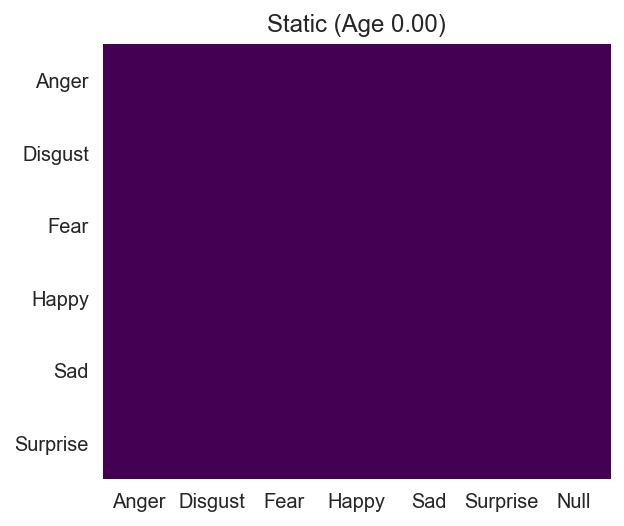

In [14]:
#### Plotting #####
tasksel = 1
fig = plt.figure()
im = plt.imshow(meanall2[:,:,10,tasksel], imlim=[0, .95], cmap='viridis', animated=True)
plt.grid('off')
plt.xticks(np.arange(len(resp_list)), resp_list)
plt.yticks(np.arange(len(exp_list)), exp_list)
title = plt.title("")

def updatefig(t):
    im.set_array(meanall2[:,:,t,tasksel])
    title.set_text(Tasksel[tasksel] + ' (Age %.2f)' %(agerange2[t]))
    return im, title

nframe = meanall2.shape[2]
ani = matplotlib.animation.FuncAnimation(fig, func=updatefig, frames=nframe, blit=True,
                       interval=1000/nif/4, repeat_delay=1000)
ani

In [15]:
ani.save('static_confmat.mp4',dpi=300)

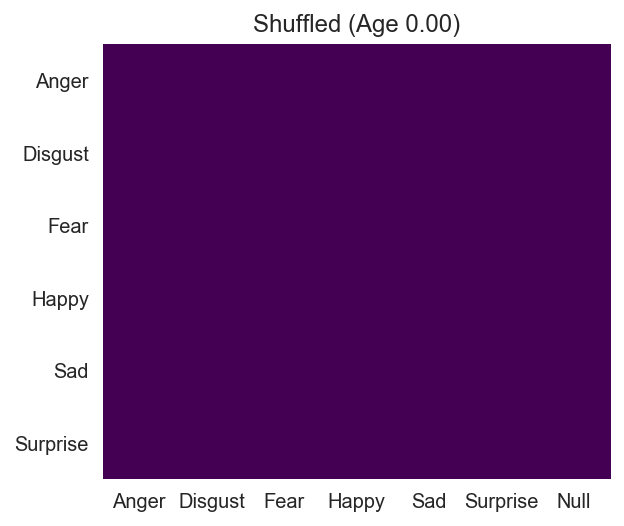

In [16]:
#### Plotting #####
tasksel = 2
fig = plt.figure()
im = plt.imshow(meanall2[:,:,10,tasksel], imlim=[0, .95], cmap='viridis', animated=True)
plt.grid('off')
plt.xticks(np.arange(len(resp_list)), resp_list)
plt.yticks(np.arange(len(exp_list)), exp_list)
title = plt.title("")

def updatefig(t):
    im.set_array(meanall2[:,:,t,tasksel])
    title.set_text(Tasksel[tasksel] + ' (Age %.2f)' %(agerange2[t]))
    return im, title

nframe = meanall2.shape[2]
ani = matplotlib.animation.FuncAnimation(fig, func=updatefig, frames=nframe, blit=True,
                       interval=1000/nif/4, repeat_delay=1000)
ani

In [17]:
ani.save('shuffled_confmat.mp4',dpi=300)


Confusion Matrix for group a05-06


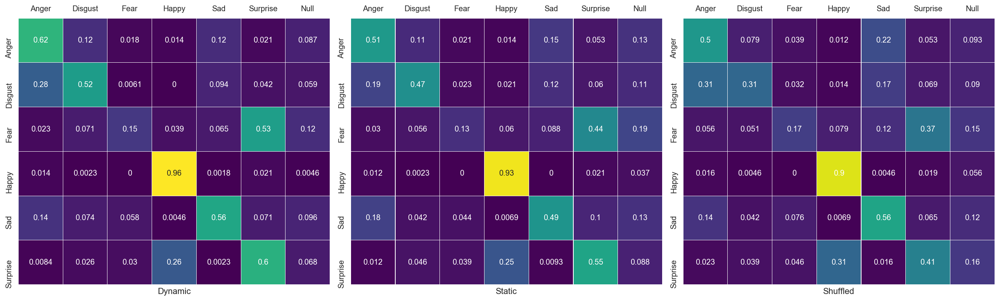


Confusion Matrix for group a07-08


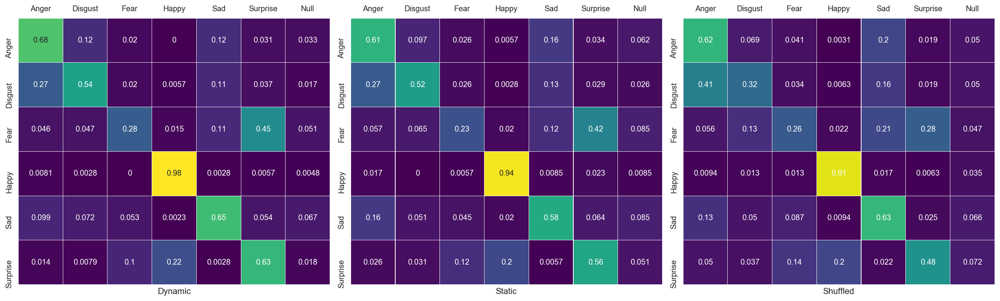


Confusion Matrix for group a09-10


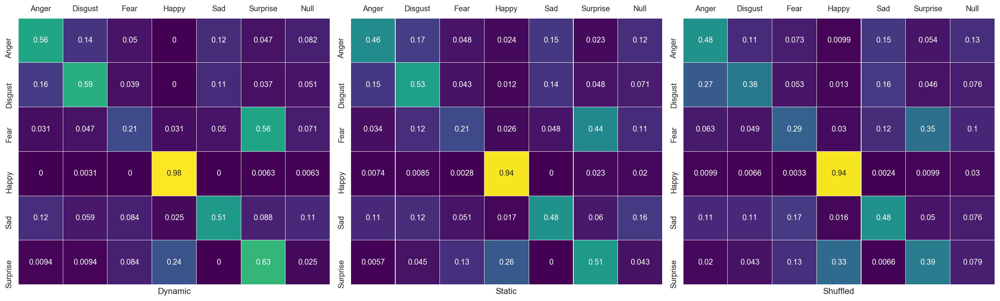


Confusion Matrix for group a11-12


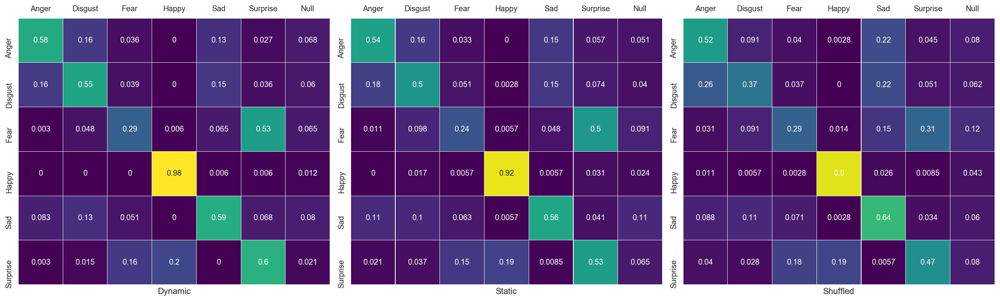


Confusion Matrix for group a13-14


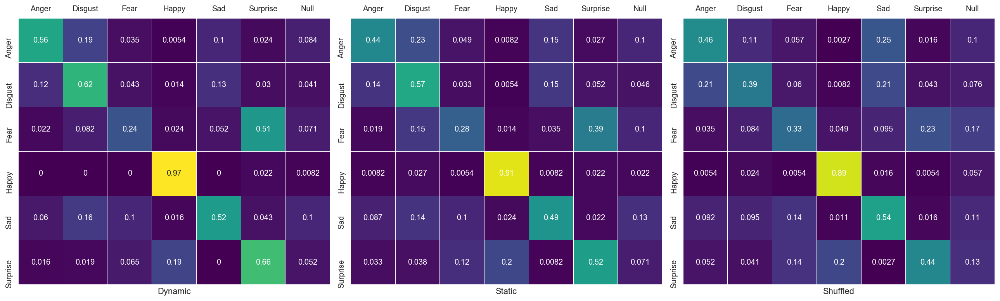


Confusion Matrix for group a15-16


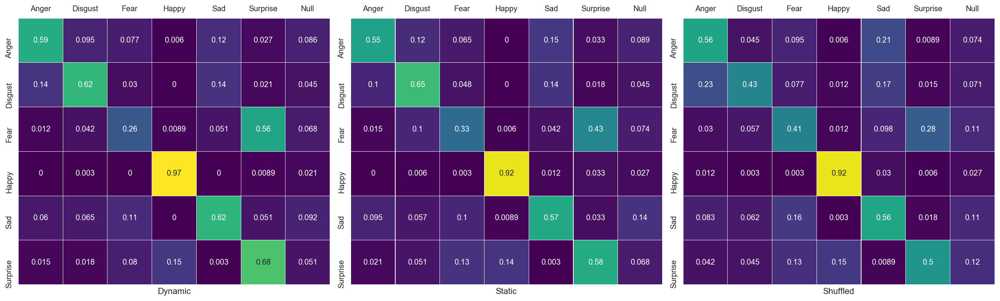


Confusion Matrix for group a17-18


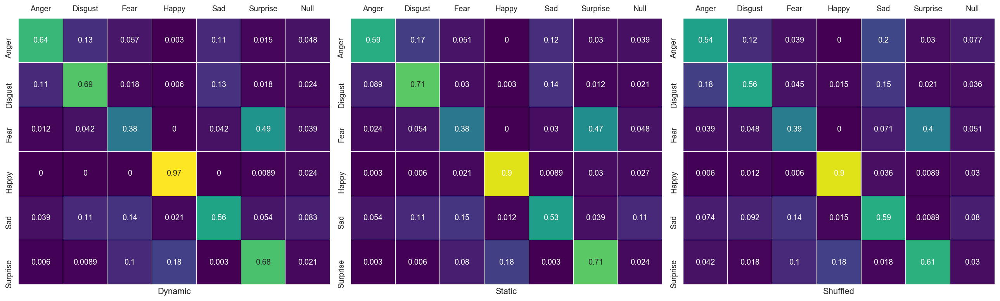


Confusion Matrix for group a19-20


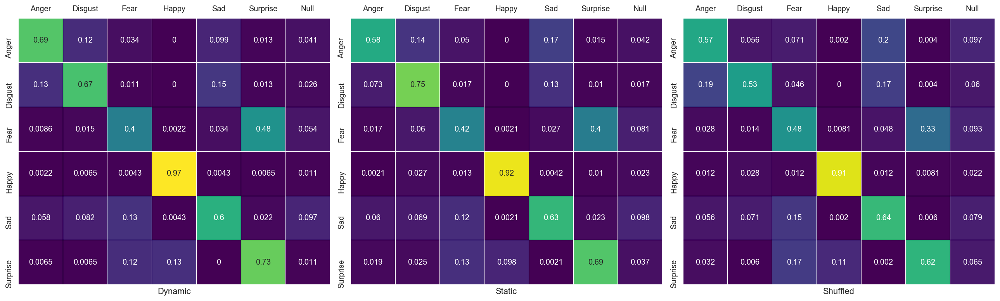


Confusion Matrix for group a21-30


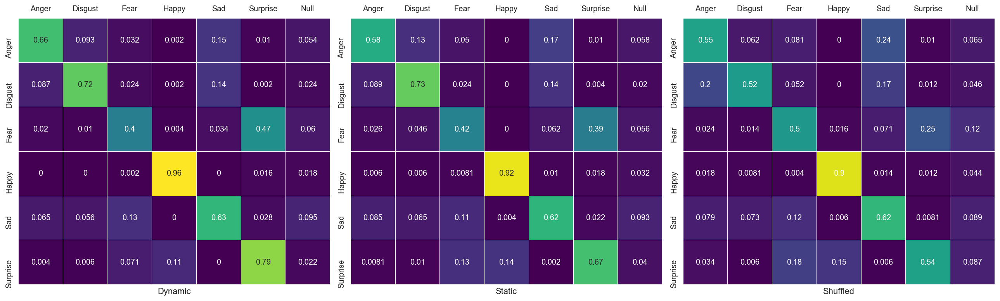


Confusion Matrix for group a31-40


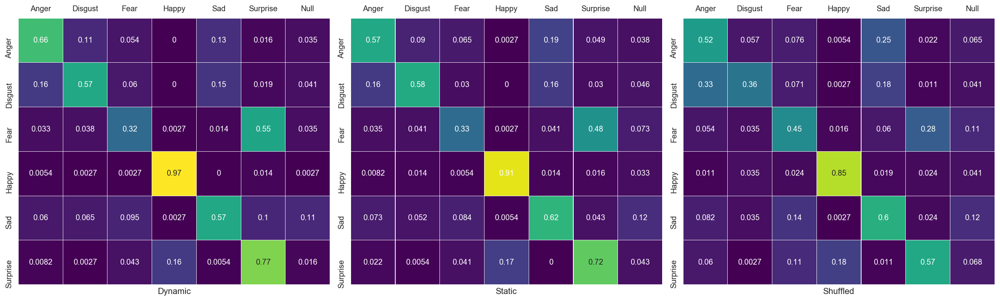


Confusion Matrix for group a41-50


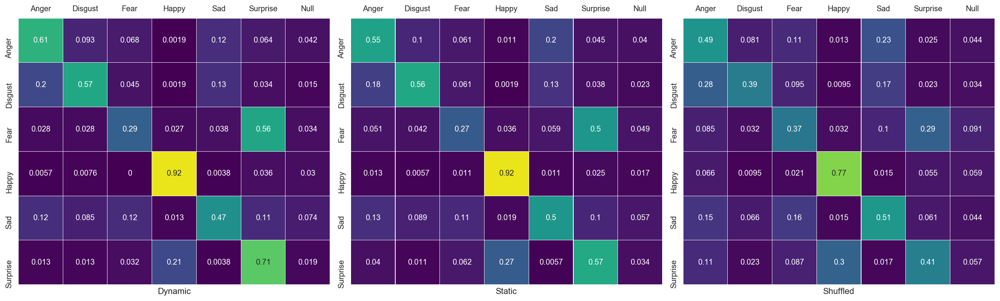


Confusion Matrix for group a51-60


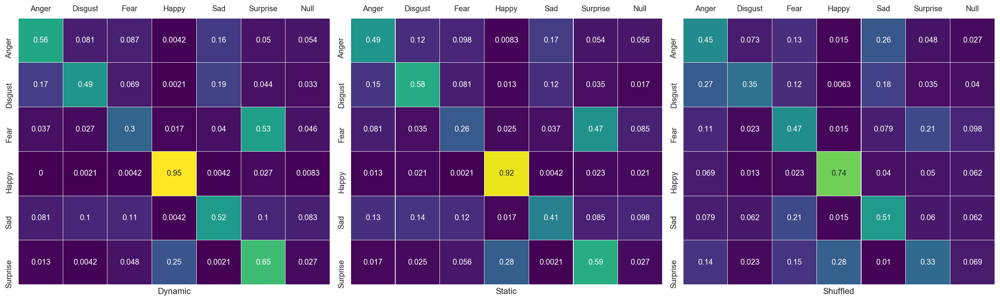


Confusion Matrix for group a61-70


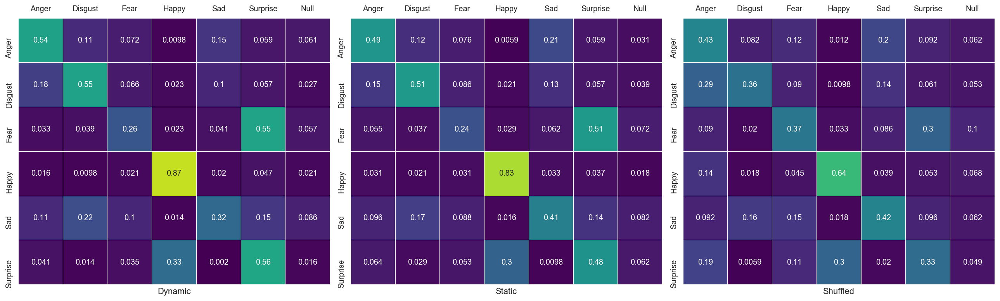


Confusion Matrix for group a71-80


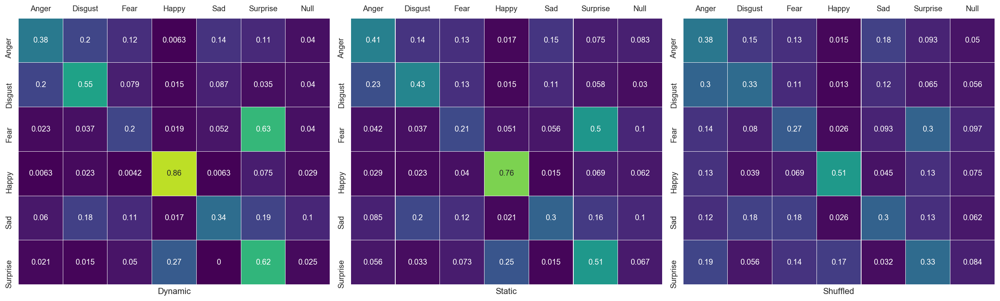


Confusion Matrix for group a81-99


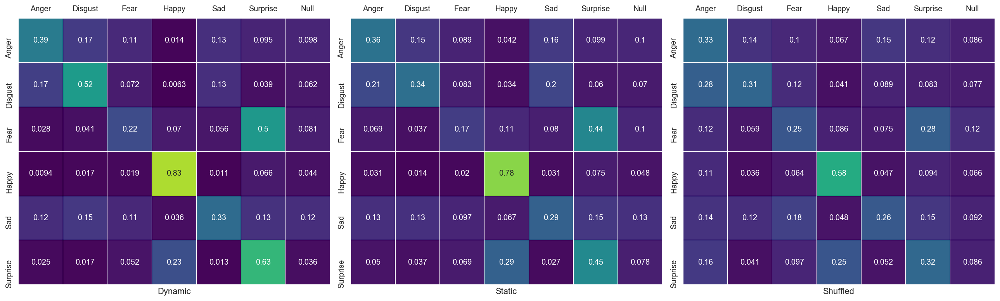

In [13]:
for iage, tblage in Info_tbl.groupby('age_group'):
    print('\nConfusion Matrix for group '+str(iage))
    Conftmp = Conf_mat[tblage.index,:,:,:6]
    Conftrl = Conf_mat[tblage.index,:,:,6]
    tmp = Conftrl-np.sum(Conftmp,axis=3)
    Conftmp2 = np.concatenate((Conftmp,np.expand_dims(tmp,axis=3)),axis=3)
    trialnum = np.reshape(np.repeat(Conftrl,7,axis=2),newshape=Conftmp2.shape)
    Confgroup = Conftmp2/trialnum
    if sum(Confgroup>1)>0:
        print('Error at group '+str(iage))
    plt.figure(figsize=(18,6))
    for ij,itask in enumerate(Tasksel):
        idx = np.where(Taskname == itask)[0][0]
        mattmp  = Confgroup[:,idx,:,:]
        meanmat = np.mean(mattmp[np.isfinite(mattmp[:,0,0]),:,:],axis=0)
        conf_mean = pd.DataFrame(meanmat,columns=resp_list,index=exp_list)
        ax = plt.subplot(1,3,ij+1)
        sns.heatmap(conf_mean, annot=True, vmin=0,vmax=.95,cbar=False, square = True,
                    linewidths=.1, cmap='viridis',ax=ax)
        ax.xaxis.tick_top()
        plt.xlabel(itask)
    plt.tight_layout()
    plt.show()

### Lineplot of accurate recognition as a function of age
It is the same as displaying the diagonal of the confusion matrix

In [11]:
Conftmp = Conf_mat[:,:,:,:6]
# NaN response as ignore
# Conftrl = np.sum(Conftmp,axis=3)
# trialnum = np.reshape(np.repeat(Conftrl,6,axis=2),newshape=Conftmp.shape)
# NaN response as incorrect
trialnum = np.reshape(np.repeat(Conf_mat[:,:,:,6],6,axis=2),newshape=Conftmp.shape)
Confmean = Conftmp/trialnum

/usr/local/lib/python3.5/dist-packages/ipykernel/__main__.py:7: RuntimeWarning: invalid value encountered in true_divide


Displaying Dynamic condition


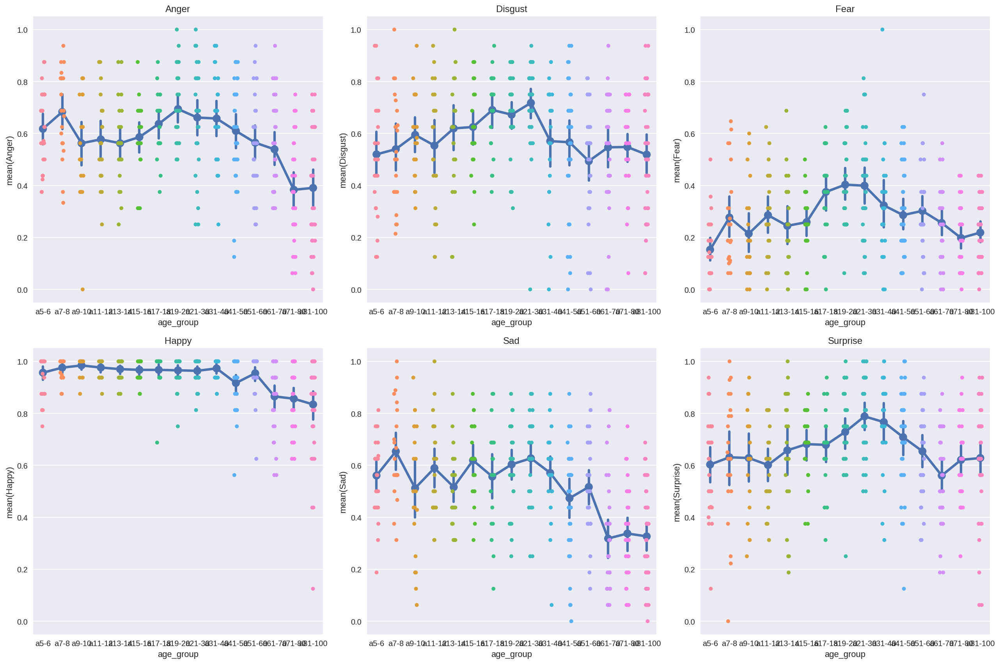

In [12]:
itask = 'Dynamic'
print('Displaying '+str(itask)+' condition')
idx = np.where(Taskname == itask)[0][0]
mattmp  = Confmean[:,idx,:,:]

plt.figure(figsize=(18,12))
datatbl1 = pd.DataFrame.copy(Info_tbl)
for ic, emolabel in enumerate(exp_list):
    datatbl1[emolabel] = mattmp[:,ic,ic]
    ax = plt.subplot(2,3,ic+1)
    sns.stripplot(x="age_group", y=emolabel, data=datatbl1, jitter=True, ax=ax);
    sns.pointplot(x="age_group", y=emolabel, data=datatbl1, estimator=np.mean, ci=95, n_boot=1000, ax=ax);
    plt.title(emolabel)
    plt.ylim([-.05,1.05])
plt.tight_layout()
plt.show()

Displaying Static condition


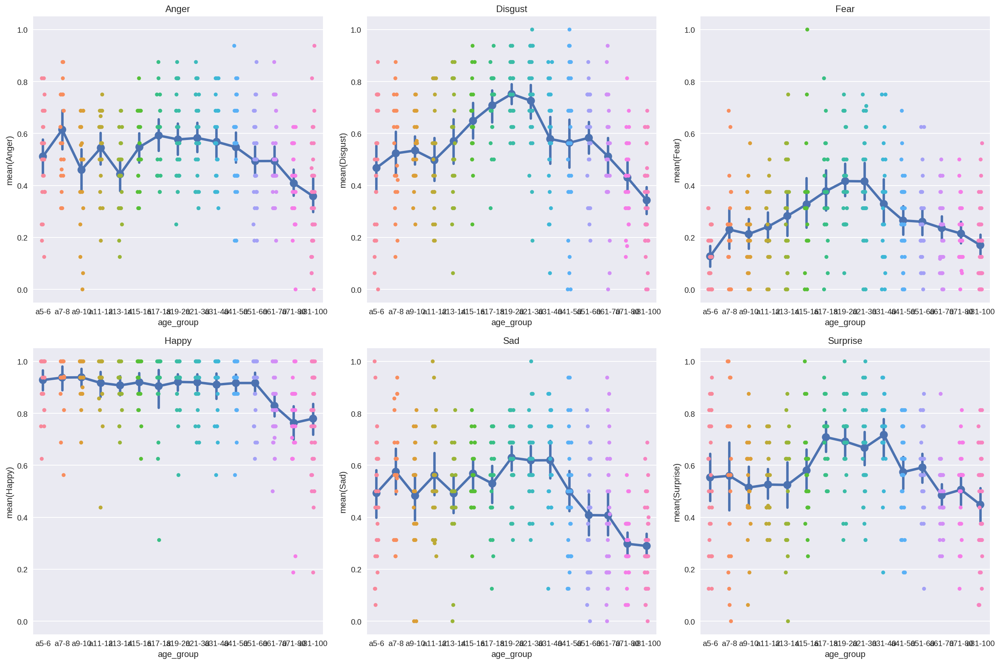

In [13]:
itask = 'Static'
print('Displaying '+str(itask)+' condition')
idx = np.where(Taskname == itask)[0][0]
mattmp  = Confmean[:,idx,:,:]

plt.figure(figsize=(18,12))
datatbl2 = pd.DataFrame.copy(Info_tbl)
for ic, emolabel in enumerate(exp_list):
    datatbl2[emolabel] = mattmp[:,ic,ic]
    ax = plt.subplot(2,3,ic+1)
    sns.stripplot(x="age_group", y=emolabel, data=datatbl2, jitter=True, ax=ax);
    sns.pointplot(x="age_group", y=emolabel, data=datatbl2, estimator=np.mean, ci=95, n_boot=1000, ax=ax);
    plt.title(emolabel)
    plt.ylim([-.05,1.05])
plt.tight_layout()
plt.show()

Displaying Shuffled condition


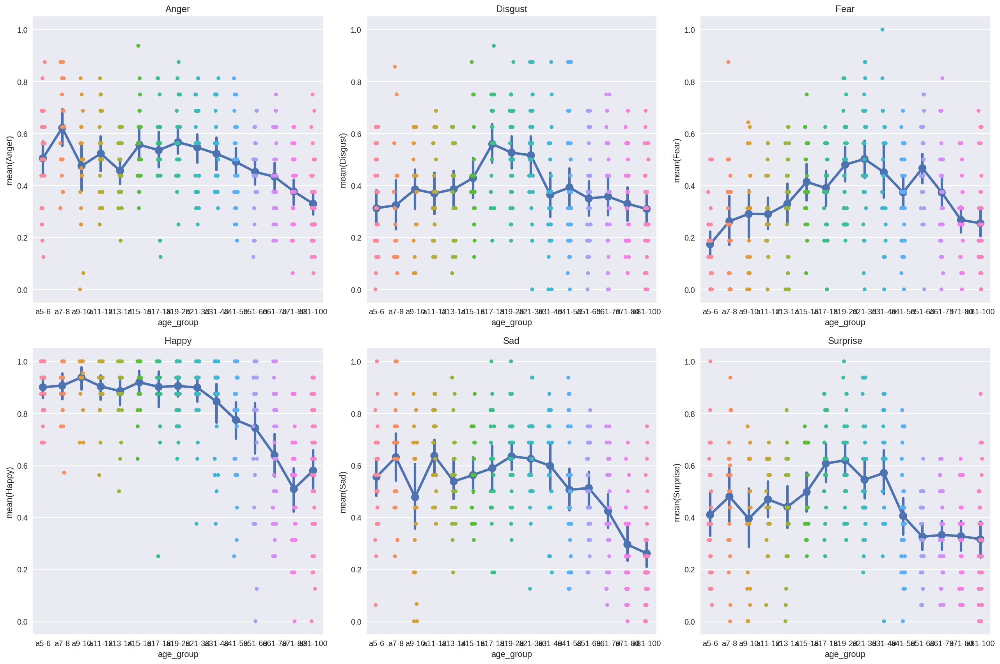

In [14]:
itask = 'Shuffled'
print('Displaying '+str(itask)+' condition')
idx = np.where(Taskname == itask)[0][0]
mattmp  = Confmean[:,idx,:,:]

plt.figure(figsize=(18,12))
datatbl3 = pd.DataFrame.copy(Info_tbl)
for ic, emolabel in enumerate(exp_list):
    datatbl3[emolabel] = mattmp[:,ic,ic]
    ax = plt.subplot(2,3,ic+1)
    sns.stripplot(x="age_group", y=emolabel, data=datatbl3, jitter=True, ax=ax);
    sns.pointplot(x="age_group", y=emolabel, data=datatbl3, estimator=np.mean, ci=95, n_boot=1000, ax=ax);
    plt.title(emolabel)
    plt.ylim([-.05,1.05])
plt.tight_layout()
plt.show()

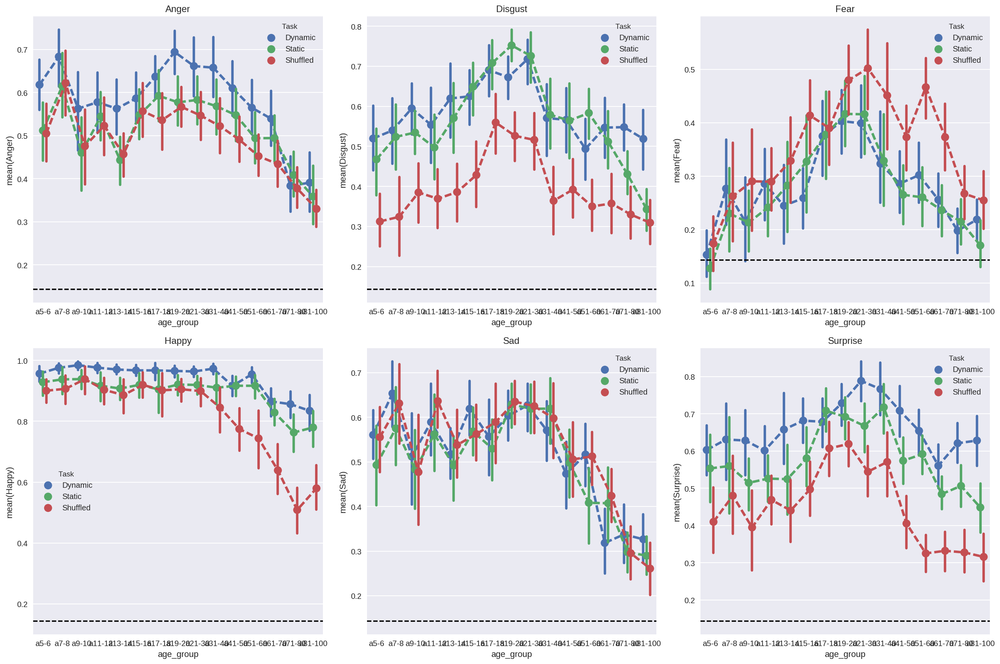

In [15]:
datatbl1['Task'] = 'Dynamic'
datatbl2['Task'] = 'Static'
datatbl3['Task'] = 'Shuffled'
datatbl_123 = pd.concat([datatbl1,datatbl2,datatbl3])

plt.figure(figsize=(18,12))
for ic, emolabel in enumerate(exp_list):
    ax = plt.subplot(2,3,ic+1)
    sns.pointplot(x="age_group", y=emolabel, hue='Task',dodge=.35,linestyles='--',
                  data=datatbl_123, estimator=np.mean, ci=95, n_boot=1000, ax=ax);
    ax.axhline(1/7,linestyle='--', color='k')
    plt.title(emolabel)
    
plt.tight_layout()
plt.show()

### Dynamic advantage as a function of age

Displaying difference: Dynamic - Static


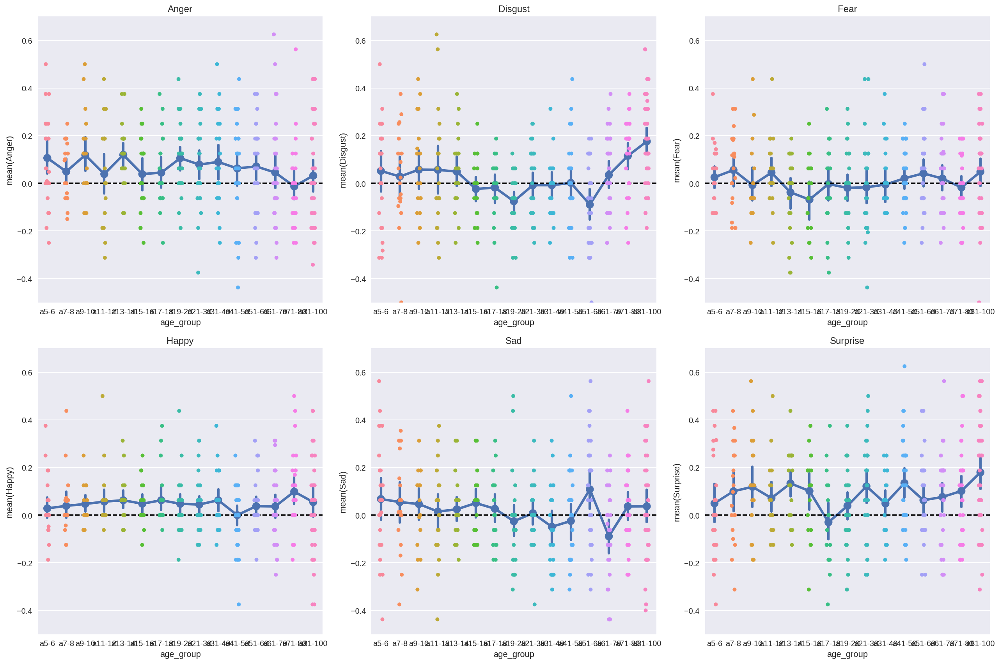

In [16]:
itask1 = 'Dynamic'
idx1 = np.where(Taskname == itask1)[0][0]
itask2 = 'Static'
idx2 = np.where(Taskname == itask2)[0][0]
mattmp  = Confmean[:,idx1,:,:]-Confmean[:,idx2,:,:]
print('Displaying difference: Dynamic - Static')

plt.figure(figsize=(18,12))
datatbl = pd.DataFrame.copy(Info_tbl)
for ic, emolabel in enumerate(exp_list):
    datatbl[emolabel] = mattmp[:,ic,ic]

    ax = plt.subplot(2,3,ic+1)
    sns.stripplot(x="age_group", y=emolabel, data=datatbl, jitter=True, ax=ax);
    sns.pointplot(x="age_group", y=emolabel, data=datatbl, estimator=np.mean, ci=95, n_boot=1000, ax=ax);
    ax.axhline(0,linestyle='--', color='k')
    plt.title(emolabel)
    plt.ylim([-.5,.7])
    #plt.ylim([-.2,.2])
    
plt.tight_layout()
plt.show()

### Gaussian Process alike

Displaying Dynamic condition
Displaying Static condition


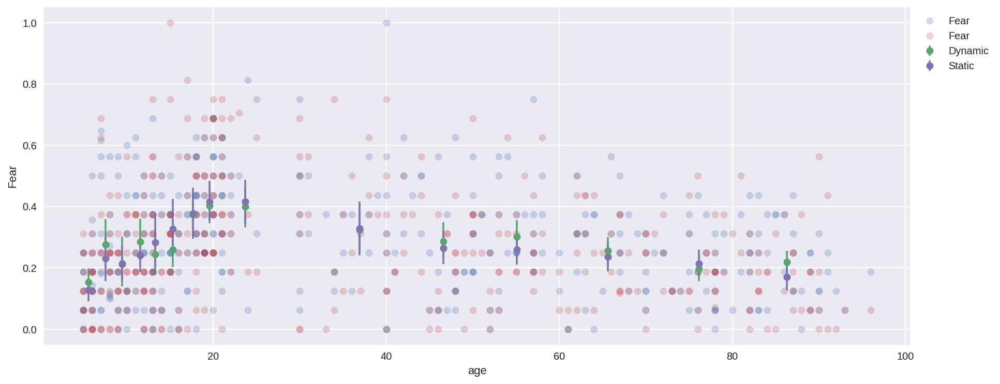

In [17]:
def plotraw(itask,emolabel,datatbl_123,ax):
    print('Displaying '+str(itask)+' condition')
    dftmp = datatbl_123.loc[datatbl_123['Task']==itask]
    ax.plot(dftmp['age'],dftmp[emolabel],'o',alpha=.25,label=emolabel)

    Nboot = 1000
    age_mean, acc_mean, acc_ci = [] , [] , []
    for iage in dftmp['age_mean'].unique():
        idex = dftmp['age_mean']==iage
        age_mean.append(iage)
        respvec = dftmp[emolabel][idex]
        meanvec = np.nanmean(np.random.choice(respvec,(len(respvec),Nboot)),axis=0)

        acc_mean.append(np.nanmean(respvec))
        acc_ci.append(np.percentile(meanvec,[2.5,97.5]))
    age_mean=np.asarray(age_mean)
    acc_mean=np.asarray(acc_mean)
    acc_ci=np.asarray(acc_ci)
    acc_ci[:,0]=acc_mean-acc_ci[:,0]
    acc_ci[:,1]=acc_ci[:,1]-acc_mean
    ax.errorbar(age_mean, acc_mean, yerr=acc_ci.transpose(), fmt='o', label=itask)
    
    ax.legend(loc=2, bbox_to_anchor=(1, 1))
    plt.ylabel(emolabel)
    plt.xlabel('age')
    
# itask  = 'Dynamic'
emolabel = 'Fear'
fig,ax= plt.subplots(1,1,figsize=(15,6))
for itask in ['Dynamic','Static']:
    plotraw(itask,emolabel,datatbl_123,ax=ax)

plt.show()

Displaying Static condition
Finding predictive mean and variance via sampling rather than quadrature


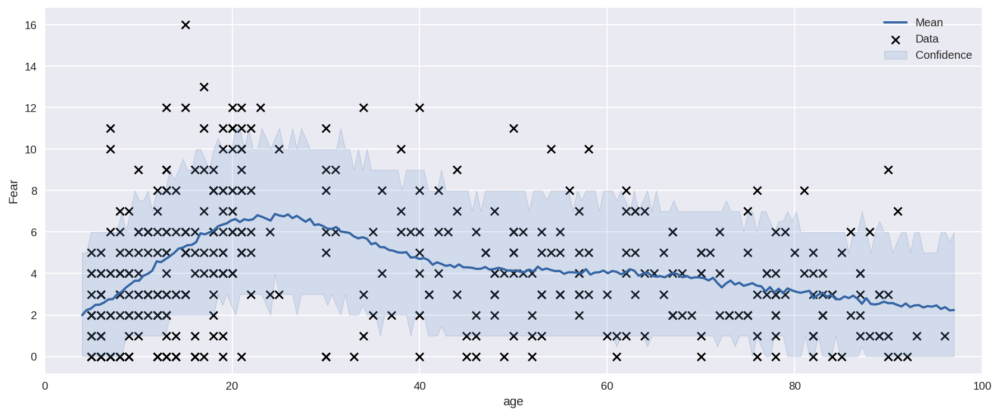

In [18]:
print('Displaying '+str(itask)+' condition')

fig, ax = plt.subplots(1,1,figsize=(15,6))

idx = np.where(Taskname == itask)[0][0]
mattmp  = Conf_mat[:,idx,:,:]
ic = np.where(exp_list == emolabel)[0][0]
Resp = mattmp[:,ic,ic].astype(int)
trials = mattmp[:,ic,-1].astype(int)

dftmp = pd.DataFrame(Resp,columns=['Resp'])
dftmp['age'] = datatbl1['age']
dftmp['age_group'] = datatbl1['age_group']
dftmp['age_group2'] = datatbl1['age_group2']
Xpred = 'age'
# DX = np.asarray(datatbl['age_group2'])+np.random.rand(len(Resp))
DX = np.asarray(dftmp[Xpred])
# DX = np.log10(DX)
incld = np.isfinite(Resp)
X = np.expand_dims(DX[incld], axis=1)
Y = np.expand_dims(Resp[incld], axis=1)
T = np.expand_dims(trials[incld],axis=1)
y_trials = {'trials': T}
# X = np.random.uniform(-3.,3.,(20,1))
# Y = np.sin(X) + np.random.randn(20,1)*0.05


import GPy
# create simple GP model
bi_lklhd = GPy.likelihoods.Binomial() 
infer = GPy.inference.latent_function_inference.Laplace()
kernel = GPy.kern.RBF(input_dim=1, variance=1., lengthscale=1.)
# kernel.lengthscale.fix(5)
gp = GPy.core.GP(X, Y, 
                 kernel=kernel, 
                 likelihood=bi_lklhd, 
                 inference_method=infer,
                 Y_metadata=y_trials)
# display(gp)
# optimize and plot
gp.optimize(messages=True)
# y_pred_mean, y_pred_var = gp.predict(np.array([[10]]), Y_metadata={'trials':16})
# print(y_pred_mean, y_pred_var)

gp.plot(plot_density=False, 
        predict_kw={'Y_metadata':{'trials':16}},
        plot_limits=[min(DX)-1,max(DX)+1],
        ax=ax)
plt.xlabel(Xpred)
plt.ylabel(emolabel)
plt.xlim([0,100])
plt.show()

# Facial expression recognition as a function of age
We are interested in the dynamic advantage of facial expression, as displayed above, expression recognition accuracy follow a curve of first increase and then decrease. Moreover, some expression shows a general dynamic display advantage (i.e., higher accuracy in dynamic versus static condition). However, the question remains whether there is a stronger dynamic advantage when the biological system is a more fragile statue (i.e., in the early age when the system still developing, and in the later age when the system is in decline).

0.65 0.3


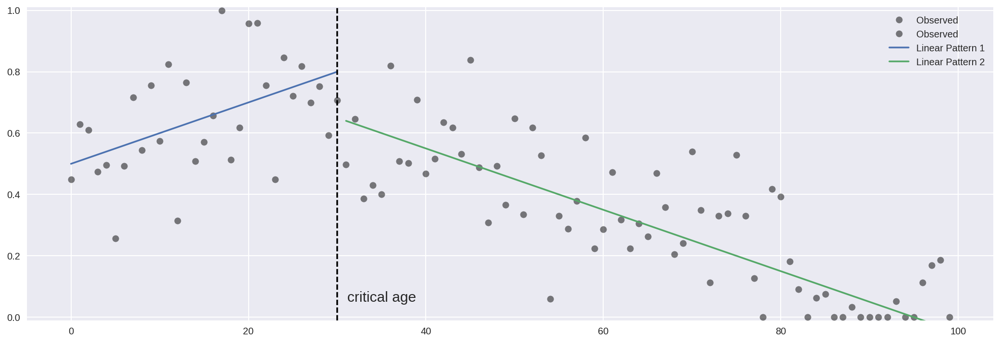

In [19]:
def emo_reg_model(intercept1,intercept2,critical_age,slope1,slope2,noise_level,
                  lmfunc=lambda intcept, delta, x: intcept + (delta*x)):
    '''
    critical_age: the onset age of cognitive decline
    intercept1: average recogtnition ability before the critical age
    intercept2: average recogtnition ability after the critical age
    slope1,slope2: linear function between age and recognition ability
    '''
    age1 = 0
    age2 = 100
    
    x1 = np.arange(age1,critical_age+1)
    y1 = lmfunc(intercept1,slope1,x1)
    noise1 = np.random.randn(len(x1))*noise_level
    x2 = np.arange(critical_age+1,age2)
    y2 = lmfunc(intercept2,slope2,x2) 
    noise2 = np.random.randn(len(x2))*noise_level
    
    y1real = np.clip(y1+noise1,0,1)
    y2real = np.clip(y2+noise2,0,1)
    print(y1.mean(),y2.mean())
    ax1=plt.plot(x1,y1real,'o',x2,y2real,'o',color='k',alpha=.5,label='Observed')
    ax2=plt.plot(x1,y1,label='Linear Pattern 1')
    ax3=plt.plot(x2,y2,label='Linear Pattern 2')
    plt.legend()
    plt.axvline(critical_age,linestyle='--', color='k')
    plt.text(critical_age+5, .05, r"critical age",
         horizontalalignment='center', fontsize=15)
    plt.ylim([-.01,1.01])

fig, ax = plt.subplots(1,1,figsize=(18,6))
emo_reg_model(.5,.95,30,0.01,-0.01,.15)

Formally, this is a [Piecewise Linear Regression Models](https://en.wikipedia.org/wiki/Piecewise_linear_function) (see [here](https://onlinecourses.science.psu.edu/stat501/node/310), and [here](http://datacolada.org/27) explaining why it is more appropreate than fitting a U-shape function expressed as high degree polynomial function). 
Here, we will express it as a Hierarchical Bayesian model and fitted in [PyMC3](https://github.com/pymc-devs/pymc3):


### Setup helper function for PyMC3

In [18]:
def getdata(itask,emolabel,agevec='age'):
    idx1 = np.where(Taskname == itask)[0][0]
    mattmp  = Conf_mat[:,idx1,:,:]
    ic = np.where(exp_list == emolabel)[0][0]
    Resp   = mattmp[:,ic,ic].astype(int)
    trials = mattmp[:,ic,-1].astype(int)
    age    = np.asarray(Info_tbl[agevec])

    incld = (np.isfinite(Resp)) & (trials > 0)
    X = age[incld]
    Y = Resp[incld]
    T = trials[incld]
    return X,Y,T

def plotfitted(agemin,critical_age,agemax,beta,intercept,cc='r'):
    lmfunc = lambda x,b,c: 1/(1+np.exp(-(x*b+c)))
    x1 = np.linspace(agemin,critical_age,100)
    y1 = lmfunc(x1,beta[0],intercept[0])
    x2 = np.linspace(critical_age,agemax,100)
    y2 = lmfunc(x2,beta[1],intercept[1])
    plt.plot(x1,y1,x2,y2,label='linear fit',color=cc)
    plt.axvline(critical_age,linestyle='--', color='k')
    plt.text(critical_age+5, -.025, r"critical age",
             horizontalalignment='center', fontsize=15)
    plt.ylim((-.05,1.05))

helper function of reading out from trace (both task modeling)

In [19]:
import pymc3 as pm
def plot_samplerstat(burnin,trace):
    # Sampler statistics
    accept = trace.get_sampler_stats('mean_tree_accept', burn=burnin)
    print('The accept rate is: %.5f' % (accept.mean()))
    diverge = trace.get_sampler_stats('diverging')
    print('Diverge of the trace')
    print(diverge.nonzero())
    energy = trace['energy']
    energy_diff = np.diff(energy)
    sns.distplot(energy - energy.mean(), label='energy')
    sns.distplot(energy_diff, label='energy diff')
    plt.legend()
    plt.show()

def plot_selectposterior(burnin,trace):
    pm.plot_posterior(trace[burnin:],varnames=['beta1','beta2'],ref_val=0,color='#87ceeb')
    
    df_stmp = pm.df_summary(trace[burnin:],varnames=['tau'])
    trace_age = np.asarray(df_stmp['mean'])
    df_stmp = pm.df_summary(trace[burnin:],varnames=['tau1'])
    trace_age1 = np.asarray(df_stmp['mean'])
    df_stmp = pm.df_summary(trace[burnin:],varnames=['tau2'])
    trace_age2 = np.asarray(df_stmp['mean'])
    df_stmp = pm.df_summary(trace[burnin:],varnames=['b1'])
    trace_intercept1 = np.asarray(df_stmp['mean'])
    df_stmp = pm.df_summary(trace[burnin:],varnames=['beta1'])
    trace_beta1 = np.asarray(df_stmp['mean'])
    df_stmp = pm.df_summary(trace[burnin:],varnames=['b2'])
    trace_intercept2 = np.asarray(df_stmp['mean'])
    df_stmp = pm.df_summary(trace[burnin:],varnames=['beta2'])
    trace_beta2 = np.asarray(df_stmp['mean'])

    fig,ax= plt.subplots(1,1,figsize=(15,6))
    for itask in ['Dynamic','Static']:
        plotraw(itask,emolabel,datatbl_123,ax=ax)

    plotfitted(agemin,trace_age1,agemax,trace_beta1,trace_intercept1,cc='green')
    plotfitted(agemin,trace_age2,agemax,trace_beta2,trace_intercept2,cc='purple')
    ax.axvline(trace_age,linestyle='--', color='r')

    pm.plot_posterior(trace[burnin:],varnames=['betadiff'],ref_val=0,color='#87ceeb')
    pm.plot_posterior(trace[burnin:],varnames=['dync_adv1','dync_adv2'],ref_val=0,color='#87ceeb')

    plt.show()
    
    dfall = pm.df_summary(trace[burnin:],varnames=['tau','tau1','tau2',
                                                   'beta1','beta2',
                                                   'betadiff','dync_adv1','dync_adv2'])
    print(dfall)

#### Model 1 - Naive model:


$$ \beta_{1},\beta_{2} \sim \text{Gaussian}(0, .001)  $$ 
$$ Intercept_{1},Intercept_{2}, \sim \text{Uniform} (0, 1) $$  
$$ \theta_{1} = \beta_{1} * age + Intercept_{1}$$ 
$$ \theta_{2} = \beta_{2} * age + Intercept_{2}$$  
$$ \tau \sim \text{Uniform} (0, 100) $$  
$$   z_{i} \sim
\begin{cases}
\text{Binomial}(\theta_{1}, n_{i}), & \text{if $age_{i} \lt \tau$} \\
\text{Binomial}(\theta_{2}, n_{i}), & \text{if $age_{i} \ge \tau$}
\end{cases}  $$

```python
import pymc3 as pm
model = pm.Model()
with model:
    # β1,β2 ∼ Gaussian(0,.001)
    beta = pm.Normal("beta", mu = 0, tau = .001, shape = 2)
    # b1,b2 ∼ Uniform(0,1)
    b = pm.Uniform("intercept", lower=0, upper=1, shape = 2)
    
    # τ ∼ Uniform(0,100)
    tau = pm.DiscreteUniform("tau", lower=agemin, upper=agemax)
    
    # p_vect = pm.math.switch(tau >= X, theta[0], theta[1])
    beta_vect = pm.math.switch(tau >= X, beta[0], beta[1])
    b_vect    = pm.math.switch(tau >= X, b[0], b[1])
    
    # θ = β∗age + Intercept
    theta = beta_vect * X + b_vect
    p_ = pm.math.clip(theta, 0, 1)
    
    obs = pm.Binomial("obs", p=p_, n=T, observed=Y)
    
Nsample = 5000
with model:
    trace = pm.sample(Nsample,njobs=2)
    
burnin = np.asarray(Nsample/2,dtype=int)
pm.traceplot(trace[burnin:])
plt.show()

pm.plot_posterior(trace[burnin:],varnames=['beta'],ref_val=0,color='#87ceeb')
pm.plot_posterior(trace[burnin:],varnames=['intercept'],color='#87ceeb')
pm.plot_posterior(trace[burnin:],varnames=['tau'],color='#87ceeb')
plt.show()
```

#### Model 2 - logistic regression:


$$ \mu \sim \text{StudentT} (0,1,3)$$ 
$$ \sigma \sim \text{HalfNormal} (1) $$   

$$ \beta,Intercept \sim \text{Gaussian}(\mu, \sigma)  $$ 
$$ logit(\theta) = \beta * age + Intercept$$   

$$ \tau \sim \text{Uniform} (0, 100) $$  

$$   z_{i} \sim
\begin{cases}
\text{Binomial}(\theta_{1}, n_{i}), & \text{if $age_{i} \lt \tau$} \\
\text{Binomial}(\theta_{2}, n_{i}), & \text{if $age_{i} \ge \tau$}
\end{cases}  $$

In [23]:
itask = 'Dynamic'
emolabel = 'Fear'
X,Y,T = getdata(itask,emolabel)
agemin=X.min()
agemax=X.max()

logitmodel = pm.Model()
with logitmodel:
    # Hyperiors for intercept
    mu_b = pm.StudentT('mu_b', nu=3, mu=0., sd=1.0)
    sigma_b = pm.HalfNormal('sigma_b', sd=1.0)

    # Hyperpriors for slope
    mu_beta = pm.StudentT('mu_beta', nu=3, mu=0., sd=1.0)
    sigma_beta = pm.HalfNormal('sigma_beta', sd=1.0)
 
    # Model the intercept
    b = pm.Normal('b', mu=mu_b, sd=sigma_b, shape=2)
    # Model the slope
    beta = pm.Normal('beta', mu=mu_beta, sd=sigma_beta, shape=2)
 
    # τ ∼ Uniform(0,100)
    tau = pm.DiscreteUniform('tau', lower=agemin, upper=agemax)
    
    beta_vect = pm.math.switch(tau >= X, beta[0], beta[1])
    b_vect    = pm.math.switch(tau >= X, b[0], b[1])
    
    # θ = β∗age + Intercept
    theta = beta_vect * X + b_vect
    yhat = pm.math.invlogit(theta)
    
    obs = pm.Binomial('obs', p=yhat, n=T, observed=Y)
    
Nsample = 5000
with logitmodel:
    trace2 = pm.sample(Nsample,njobs=2)

Assigned NUTS to mu_b
Assigned NUTS to sigma_b_log_
Assigned NUTS to mu_beta
Assigned NUTS to sigma_beta_log_
Assigned NUTS to b
Assigned NUTS to beta
Assigned Metropolis to tau
100%|██████████| 5000/5000 [03:19<00:00, 14.63it/s]


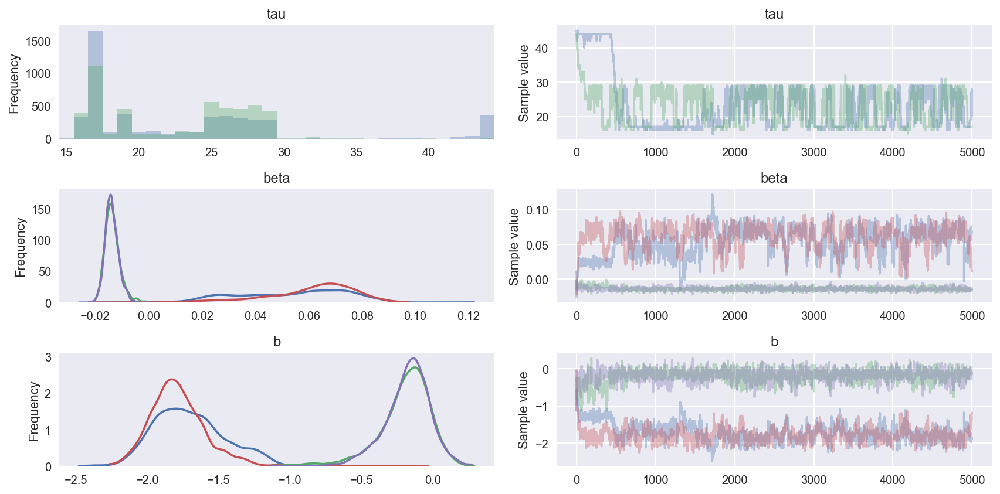

In [24]:
pm.traceplot(trace2,varnames=['tau','beta','b'])
plt.show()

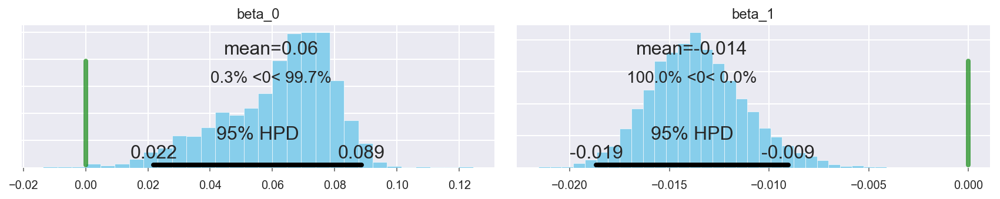

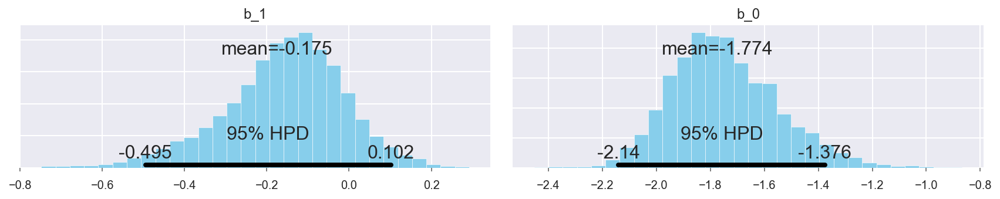

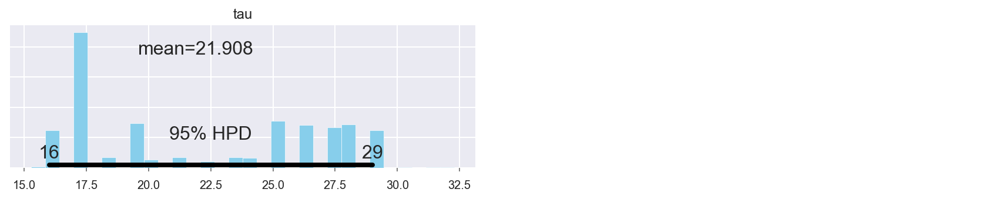

In [25]:
burnin = 1000

pm.plot_posterior(trace2[burnin:],varnames=['beta'],ref_val=0,color='#87ceeb')
pm.plot_posterior(trace2[burnin:],varnames=['b'],color='#87ceeb')
pm.plot_posterior(trace2[burnin:],varnames=['tau'],color='#87ceeb')
plt.show()

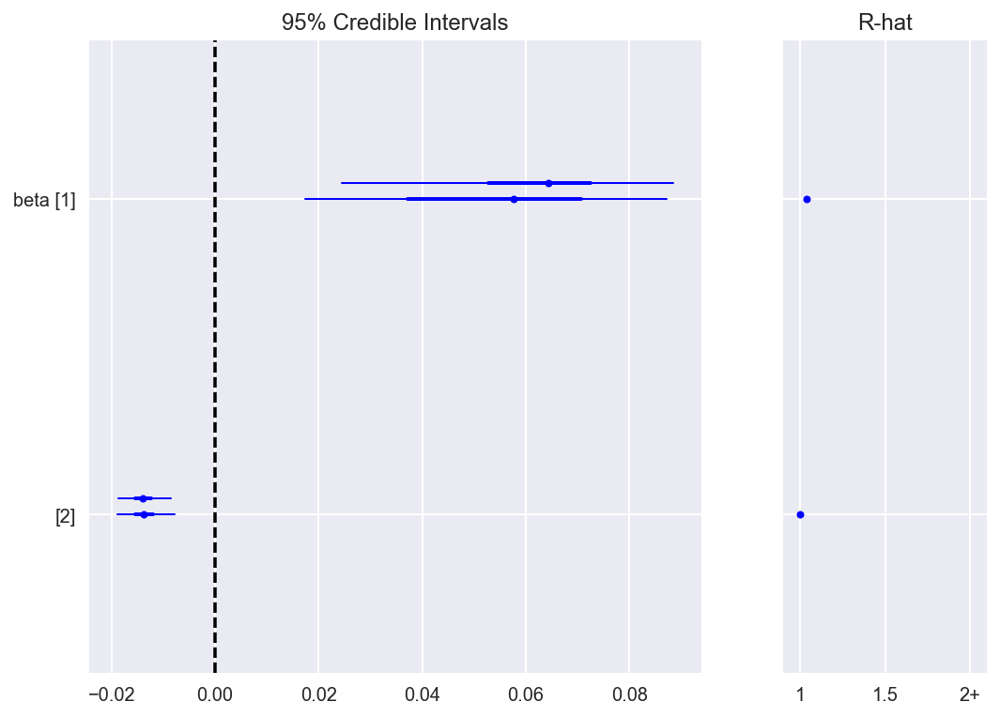

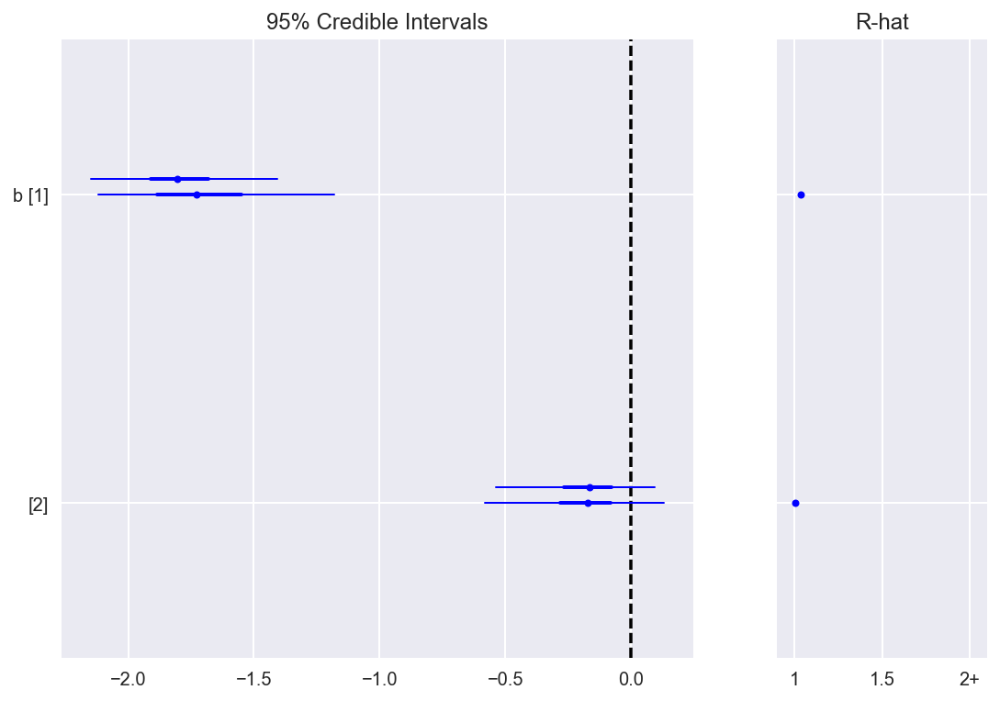

In [26]:
pm.forestplot(trace2, varnames=['beta'])
plt.show()
pm.forestplot(trace2, varnames=['b'])
plt.show()

Displaying Dynamic condition


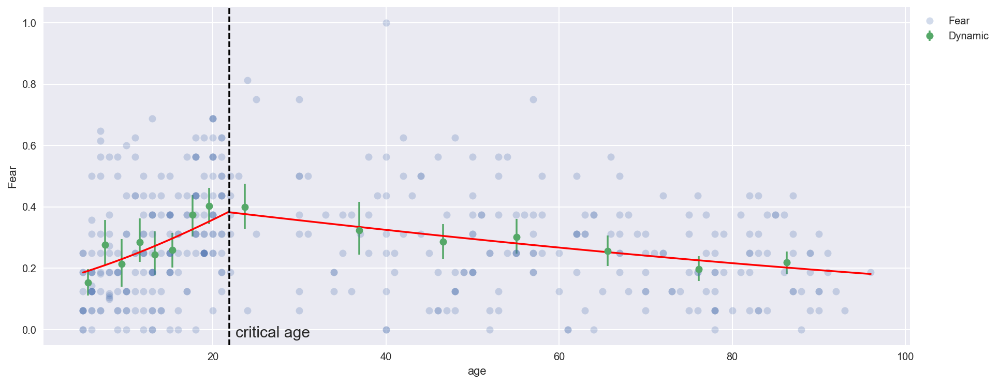

In [27]:
df_summary1 = pm.df_summary(trace2[burnin:],varnames=['tau'])
trace_age = np.asarray(df_summary1['mean'])
df_summary1 = pm.df_summary(trace2[burnin:],varnames=['b'])
trace_intercept = np.asarray(df_summary1['mean'])
df_summary1 = pm.df_summary(trace2[burnin:],varnames=['beta'])
trace_beta = np.asarray(df_summary1['mean'])
    
fig,ax= plt.subplots(1,1,figsize=(15,6))
plotraw(itask,emolabel,datatbl_123,ax=ax)
plotfitted(agemin,trace_age,agemax,trace_beta,trace_intercept)
plt.show()

#### Model 2 for both dynamic and static
Model two task together, with the critical age as common factor. Differences of the slopes between two task is computed deterministically.

In [25]:
emolabel = 'Sad'
X1,Y1,T1 = getdata('Dynamic',emolabel)
X2,Y2,T2 = getdata('Static',emolabel)
agemin = X1.min()
agemax = X1.max()

Nsample = 100000
logitwithdiff = pm.Model()
with logitwithdiff:
    # Hyperiors for intercept
    mu_b = pm.StudentT('mu_b', nu=3, mu=0., sd=1.0)
    sigma_b = pm.HalfNormal('sigma_b', sd=1.0)
    # Hyperpriors for slope
    mu_beta = pm.StudentT('mu_beta', nu=3, mu=0., sd=1.0)
    sigma_beta = pm.HalfNormal('sigma_beta', sd=1.0)
    
    # τ ∼ Uniform(0,100)
    tau = pm.Uniform('tau', lower=agemin, upper=agemax)
    tausigma = 5.
    tau1 = pm.Normal('tau1', mu=tau, sd=tausigma)
    tau2 = pm.Normal('tau2', mu=tau, sd=tausigma)
    
    # Model the intercept
    b1 = pm.Normal('b1', mu=mu_b, sd=sigma_b, shape=2)
    b2 = pm.Normal('b2', mu=mu_b, sd=sigma_b, shape=2)
    # Model the slope
    beta1 = pm.Normal('beta1', mu=mu_beta, sd=sigma_beta, shape=2)
    beta2 = pm.Normal('beta2', mu=mu_beta, sd=sigma_beta, shape=2)
    
    beta_vect1 = pm.math.switch(tau1 >= X1, beta1[0], beta1[1])
    beta_vect2 = pm.math.switch(tau2 >= X2, beta2[0], beta2[1])
    b_vect1    = pm.math.switch(tau1 >= X1, b1[0], b1[1])
    b_vect2    = pm.math.switch(tau2 >= X2, b2[0], b2[1])
    
    # θ = β∗age + Intercept
    theta1 = beta_vect1 * X1 + b_vect1
    theta2 = beta_vect2 * X2 + b_vect2
    yhat1 = pm.math.invlogit(theta1)
    yhat2 = pm.math.invlogit(theta2)
    
    obs1 = pm.Binomial('obs1', p=yhat1, n=T1, observed=Y1)
    obs2 = pm.Binomial('obs2', p=yhat2, n=T2, observed=Y2)
    
    # differences of slope
    betadiff = pm.Deterministic('betadiff',beta1-beta2)
    # general dynamic advantage
    dync_adv1 = pm.Deterministic('dync_adv1',pm.math.invlogit(beta1[0]*(agemin+tau)/2+b1[0]) - 
                                             pm.math.invlogit(beta2[0]*(agemin+tau)/2+b2[0]))
    dync_adv2 = pm.Deterministic('dync_adv2',pm.math.invlogit(beta1[1]*(agemax+tau)/2+b1[1]) - 
                                             pm.math.invlogit(beta2[1]*(agemax+tau)/2+b2[1]))
    
    trace2 = pm.sample(Nsample,njobs=2,step=pm.Metropolis())

100%|██████████| 100000/100000 [10:17<00:00, 161.89it/s]


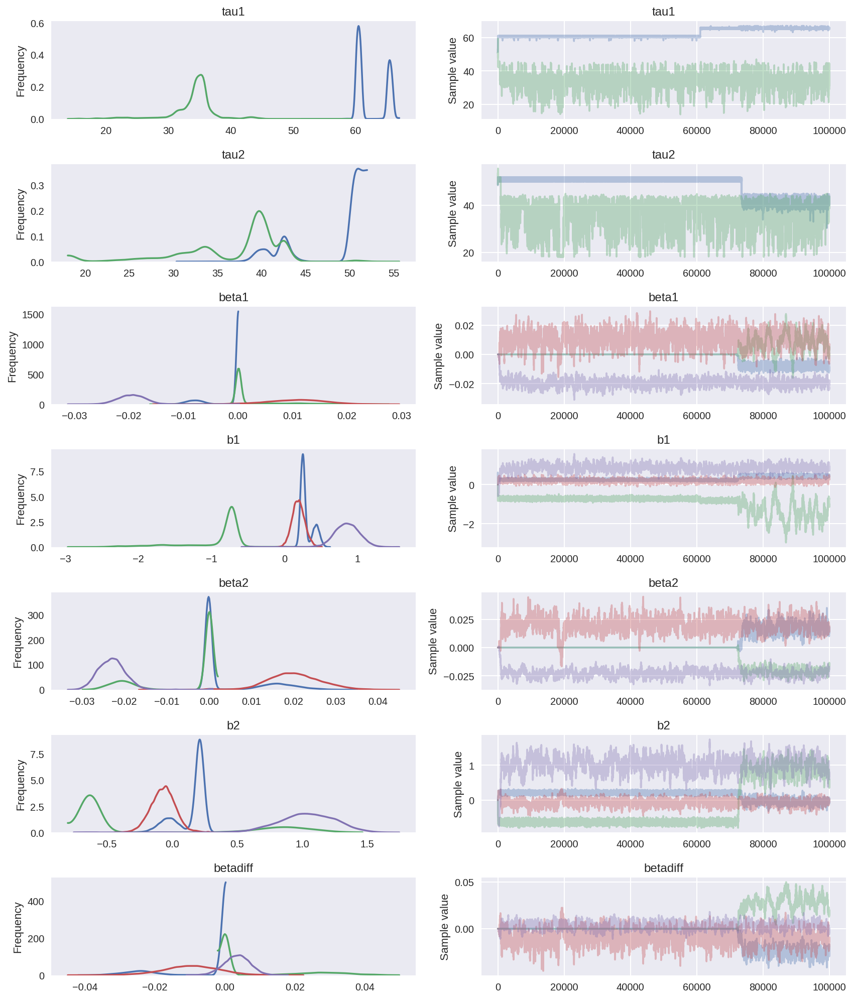

In [26]:
pm.traceplot(trace2,varnames=['tau1','tau2','beta1','b1','beta2','b2','betadiff'])
plt.show()

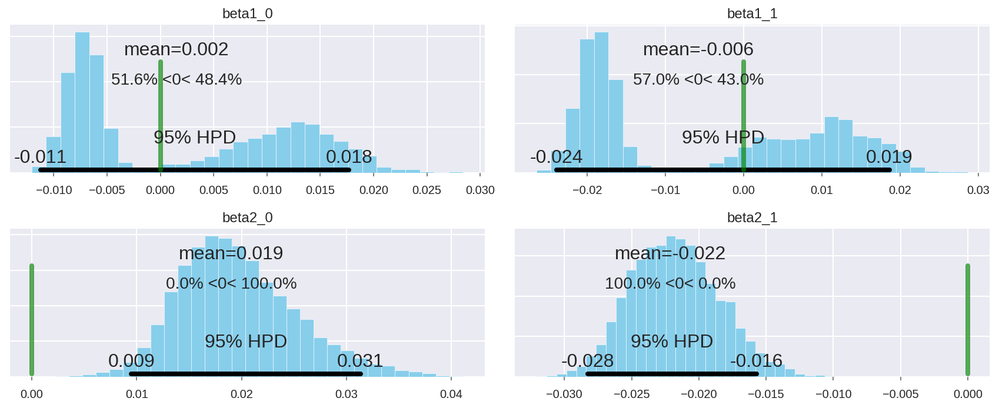

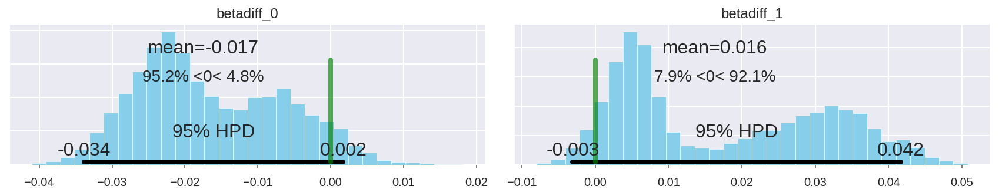

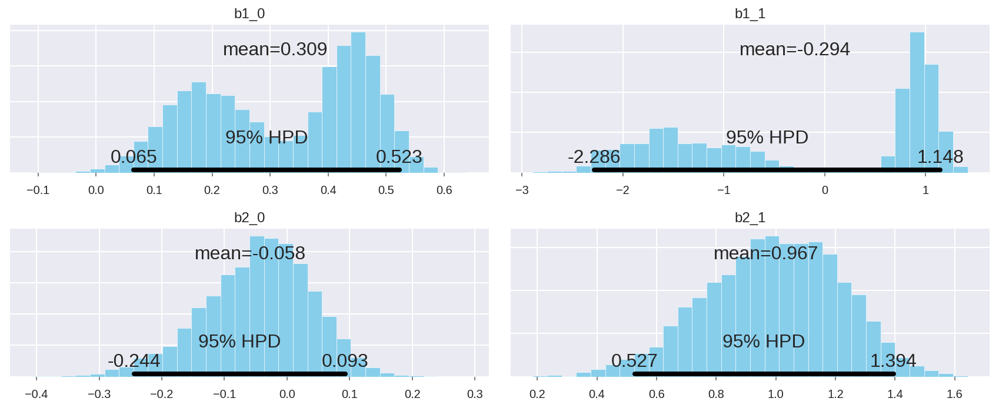

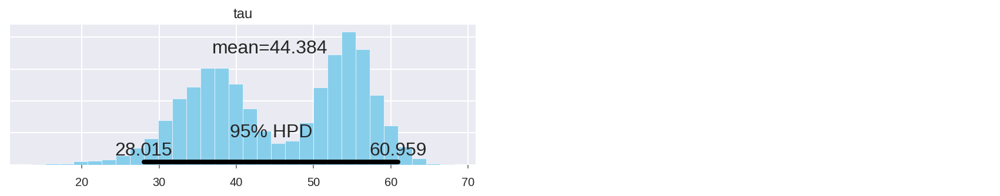

In [27]:
burnin = 80000

pm.plot_posterior(trace2[burnin:],varnames=['beta1','beta2'],ref_val=0,color='#87ceeb')
pm.plot_posterior(trace2[burnin:],varnames=['betadiff'],ref_val=0,color='#87ceeb')
pm.plot_posterior(trace2[burnin:],varnames=['b1','b2'],color='#87ceeb')
pm.plot_posterior(trace2[burnin:],varnames=['tau'],color='#87ceeb')
plt.show()

Displaying Dynamic condition
Displaying Static condition


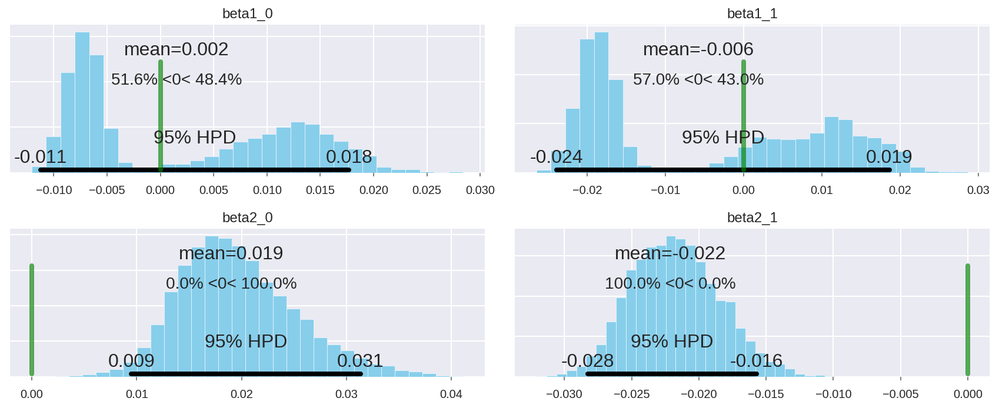

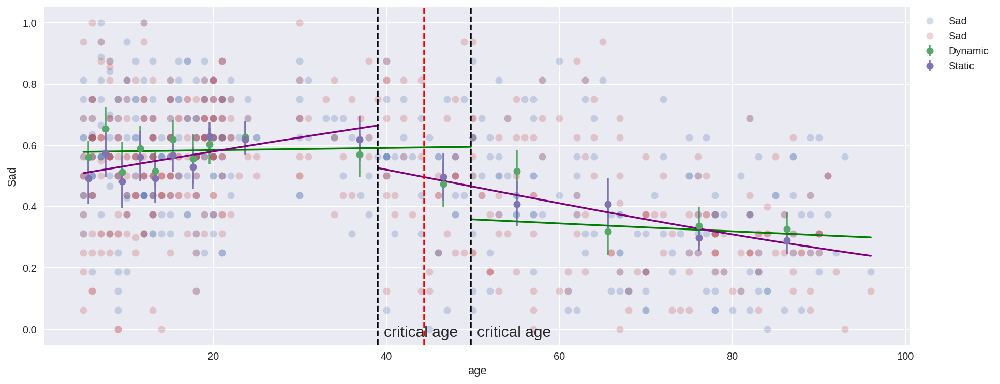

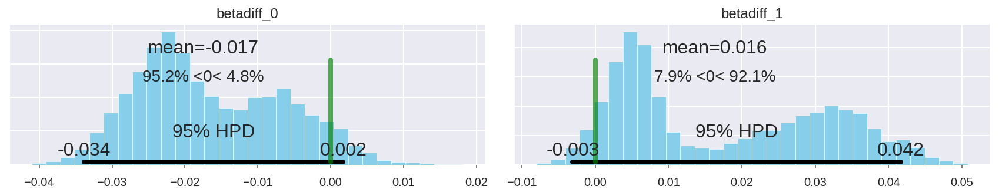

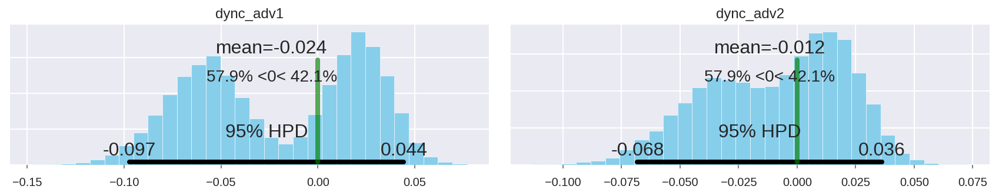

                  mean         sd  mc_error    hpd_2.5   hpd_97.5
tau          44.383833  10.150935  0.926308  28.014522  60.958646
tau1         49.783850  15.864831  1.572102  30.855436  66.528017
tau2         39.026460   4.736645  0.334932  28.123937  44.022731
beta1__0      0.001538   0.010204  0.000970  -0.011257   0.017702
beta1__1     -0.005774   0.015002  0.001482  -0.023880   0.018639
beta2__0      0.019030   0.005612  0.000386   0.009490   0.031345
beta2__1     -0.022112   0.003271  0.000250  -0.028275  -0.015718
betadiff__0  -0.017492   0.010047  0.000869  -0.033838   0.001721
betadiff__1   0.016337   0.014227  0.001386  -0.003069   0.041659
dync_adv1    -0.023860   0.044461  0.004090  -0.097328   0.044393
dync_adv2    -0.011780   0.029466  0.002403  -0.068217   0.036218


In [28]:
plot_selectposterior(burnin=80000,trace=trace2)

#### Model 3

In [41]:
itask = 'Dynamic'
emolabel = 'Anger'
X,Y,T = getdata(itask,emolabel)
agemin = X.min()
agemax = X.max()

import pymc3 as pm
logitmodel = pm.Model()
with logitmodel:
    # Hyperpriors for slope
    mu_beta = pm.StudentT('mu_beta', nu=3, mu=0., sd=1.0)
    sigma_beta = pm.HalfNormal('sigma_beta', sd=1.0)
    
    # τ ∼ Uniform(0,100)
    tau = pm.DiscreteUniform('tau', lower=agemin, upper=agemax)
    
    # Recognition ability at τ 
    thetak = pm.Beta('thetak', alpha=1, beta=1)
    
    # Model the slope
    beta = pm.Normal('beta', mu=mu_beta, sd=sigma_beta, shape=2)
    # Model the intercept
    b = pm.Deterministic('b', pm.math.logit(thetak) - tau*beta)
    
    beta_vect = pm.math.switch(tau >= X, beta[0], beta[1])
    b_vect    = pm.math.switch(tau >= X, b[0], b[1])
    
    # θ = β∗age + Intercept
    theta = beta_vect * X + b_vect
    yhat = pm.math.invlogit(theta)
    
    obs = pm.Binomial('obs', p=yhat, n=T, observed=Y)
    
Nsample = 5000
with logitmodel:
    trace2 = pm.sample(Nsample,njobs=2)

Assigned NUTS to mu_beta
Assigned NUTS to sigma_beta_log_
Assigned Metropolis to tau
Assigned NUTS to thetak_logodds_
Assigned NUTS to beta
100%|██████████| 5000/5000 [01:27<00:00, 56.90it/s]


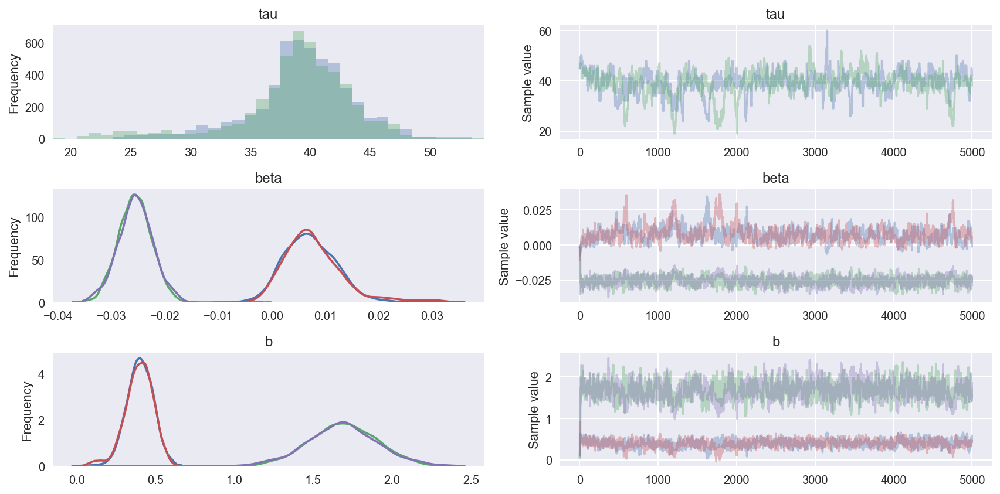

In [42]:
pm.traceplot(trace2,varnames=['tau','beta','b'])
plt.show()

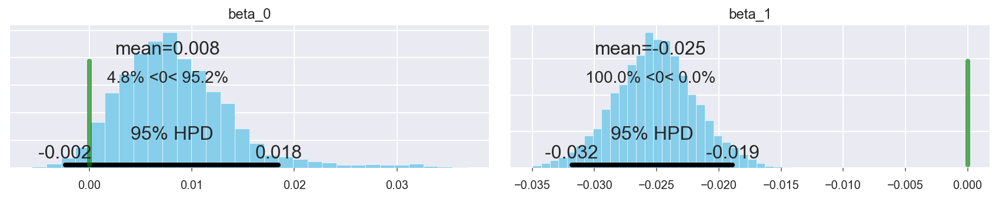

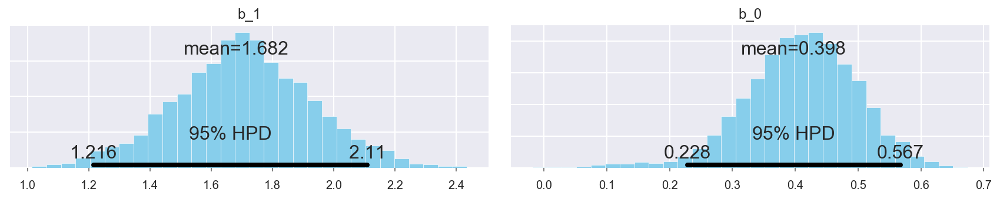

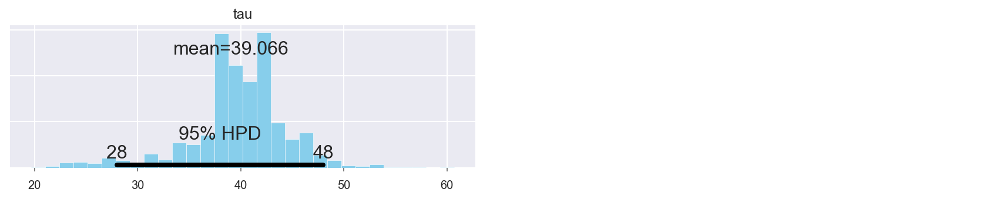

In [43]:
burnin = 1000

pm.plot_posterior(trace2[burnin:],varnames=['beta'],ref_val=0,color='#87ceeb')
pm.plot_posterior(trace2[burnin:],varnames=['b'],color='#87ceeb')
pm.plot_posterior(trace2[burnin:],varnames=['tau'],color='#87ceeb')
plt.show()

Displaying Dynamic condition


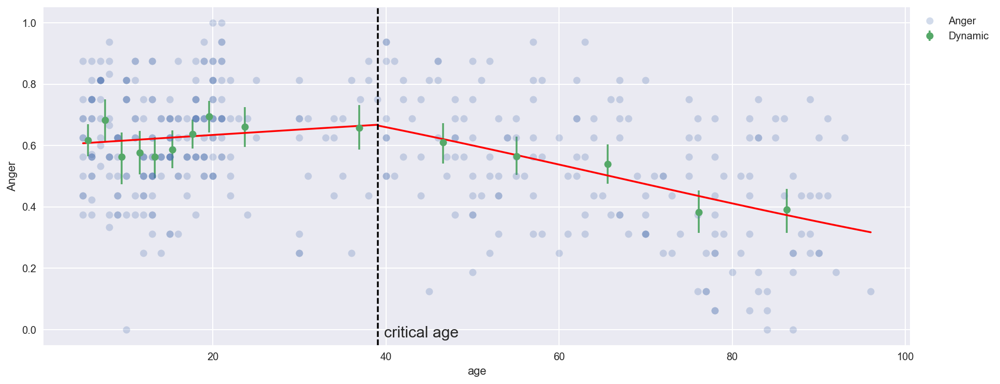

In [44]:
df_summary1 = pm.df_summary(trace2[burnin:],varnames=['tau'])
trace_age = np.asarray(df_summary1['mean'])
df_summary1 = pm.df_summary(trace2[burnin:],varnames=['b'])
trace_intercept = np.asarray(df_summary1['mean'])
df_summary1 = pm.df_summary(trace2[burnin:],varnames=['beta'])
trace_beta = np.asarray(df_summary1['mean'])
    
fig,ax= plt.subplots(1,1,figsize=(15,6))
plotraw(itask,emolabel,datatbl_123,ax=ax)
plotfitted(agemin,trace_age,agemax,trace_beta,trace_intercept)
plt.show()

#### Model 3 for both dynamic and static


In [29]:
def model3_diff(emolabel,task1 = 'Dynamic',task2 = 'Static',Nsample=10000):
    X1,Y1,T1 = getdata(task1,emolabel)
    X2,Y2,T2 = getdata(task2,emolabel)
    agemin = X1.min()
    agemax = X1.max()

    Nt = 16 # number of trials by design
    logitwithdiff = pm.Model()
    with logitwithdiff:
        # Hyperpriors for slope
        mu_beta = pm.StudentT('mu_beta', nu=3, mu=0., sd=1.0)
        sigma_beta = pm.HalfNormal('sigma_beta', sd=1.0)

        # τ ∼ Uniform(0,100)
        tau = pm.Uniform('tau', lower=agemin, upper=agemax)
        tausigma = 10.
        tau1 = pm.Normal('tau1', mu=tau, sd=tausigma)
        tau2 = pm.Normal('tau2', mu=tau, sd=tausigma)

        # Recognition ability at τ 
        theta = pm.Uniform('theta', lower=0, upper=1)
        kappa_m2 = pm.Uniform('kappa',lower=0, upper=Nt-2)
        alpha = theta * kappa_m2 + 1
        beta = (1-theta) * kappa_m2 + 1
        thetak1 = pm.Beta('thetak1', alpha=alpha, beta=beta)
        thetak2 = pm.Beta('thetak2', alpha=alpha, beta=beta)

        # Model the slope
        beta1 = pm.Normal('beta1', mu=mu_beta, sd=sigma_beta, shape=2)
        beta2 = pm.Normal('beta2', mu=mu_beta, sd=sigma_beta, shape=2)
        # Model the intercept
        b1 = pm.Deterministic('b1', pm.math.logit(thetak1) - tau1*beta1)
        b2 = pm.Deterministic('b2', pm.math.logit(thetak2) - tau2*beta2)

        beta_vect1 = pm.math.switch(tau1 >= X1, beta1[0], beta1[1])
        beta_vect2 = pm.math.switch(tau2 >= X2, beta2[0], beta2[1])
        b_vect1    = pm.math.switch(tau1 >= X1, b1[0], b1[1])
        b_vect2    = pm.math.switch(tau2 >= X2, b2[0], b2[1])

        # θ = β∗age + Intercept
        theta1 = beta_vect1 * X1 + b_vect1
        yhat1 = pm.math.invlogit(theta1)
        theta2 = beta_vect2 * X2 + b_vect2
        yhat2 = pm.math.invlogit(theta2)

        obs1 = pm.Binomial('obs1', p=yhat1, n=T1, observed=Y1)
        obs2 = pm.Binomial('obs2', p=yhat2, n=T2, observed=Y2)

        # differences of slope
        betadiff = pm.Deterministic('betadiff',beta1-beta2)
        # general dynamic advantage
        dync_adv1 = pm.Deterministic('dync_adv1',pm.math.invlogit(beta1[0]*(agemin+tau)/2+b1[0]) - 
                                                 pm.math.invlogit(beta2[0]*(agemin+tau)/2+b2[0]))
        dync_adv2 = pm.Deterministic('dync_adv2',pm.math.invlogit(beta1[1]*(agemax+tau)/2+b1[1]) - 
                                                 pm.math.invlogit(beta2[1]*(agemax+tau)/2+b2[1]))

    #     step = pm.NUTS(target_accept= .9)
    #     trace = pm.sample(Nsample, njobs=2, tune=10000, step=step)
        trace = pm.sample(Nsample, njobs=2)
    return trace

### Anger

Auto-assigning NUTS sampler...
Initializing NUTS using advi...
Average ELBO = -2,157: 100%|██████████| 200000/200000 [01:09<00:00, 2897.69it/s]  
Finished [100%]: Average ELBO = -2,157
100%|██████████| 10000/10000 [02:00<00:00, 92.48it/s]


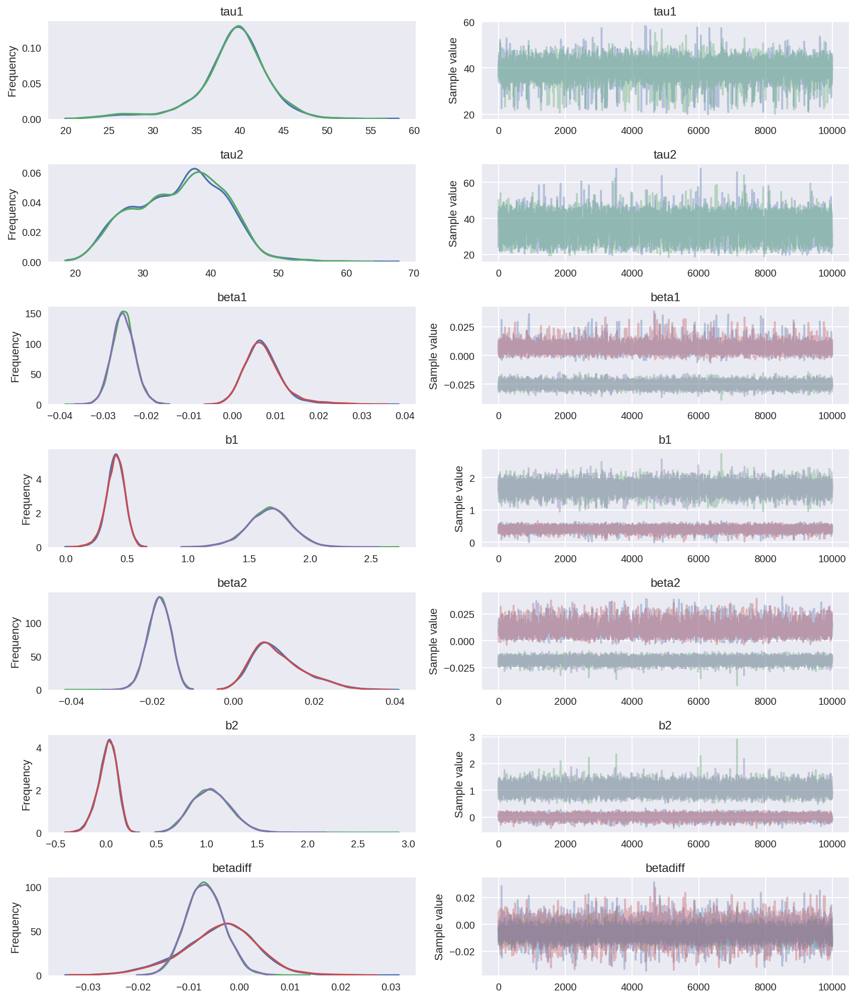

In [30]:
emolabel = 'Anger'
trace_anger = model3_diff(emolabel)
pm.traceplot(trace_anger,varnames=['tau1','tau2','beta1','b1','beta2','b2','betadiff'])
plt.show()

The accept rate is: 0.79969
Diverge of the trace
(array([   68,    95,   425,  1835,  8338, 10028, 10115, 10602, 10658,
       10679, 12147, 14628, 15197, 16039, 18393]),)


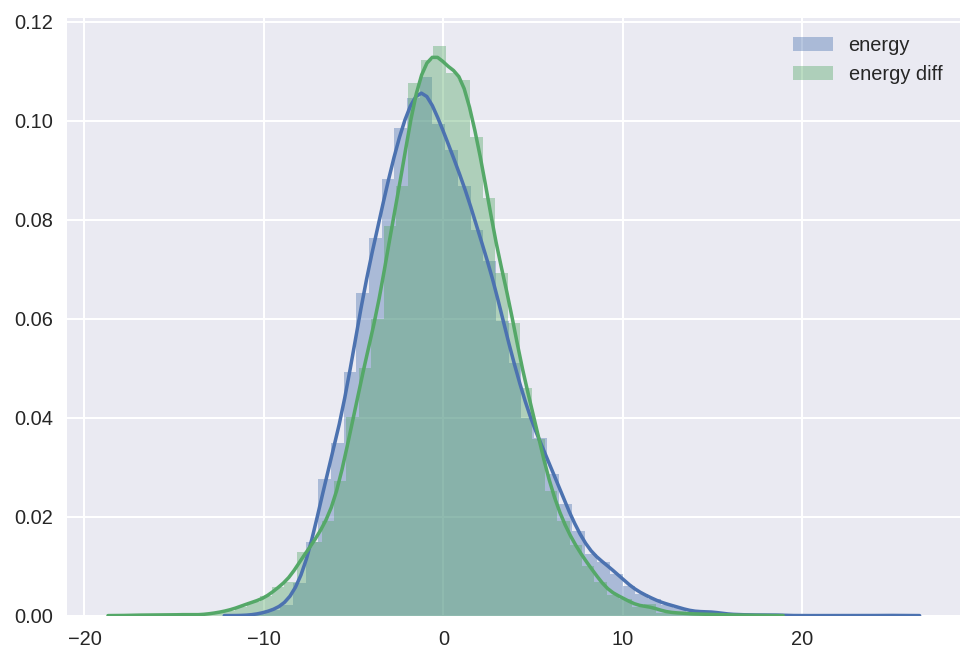

In [31]:
plot_samplerstat(burnin=8000,trace=trace_anger)

Displaying Dynamic condition
Displaying Static condition


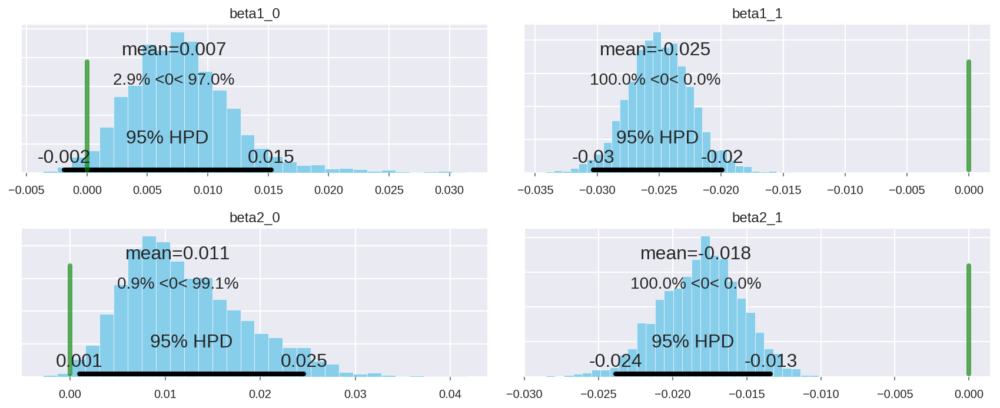

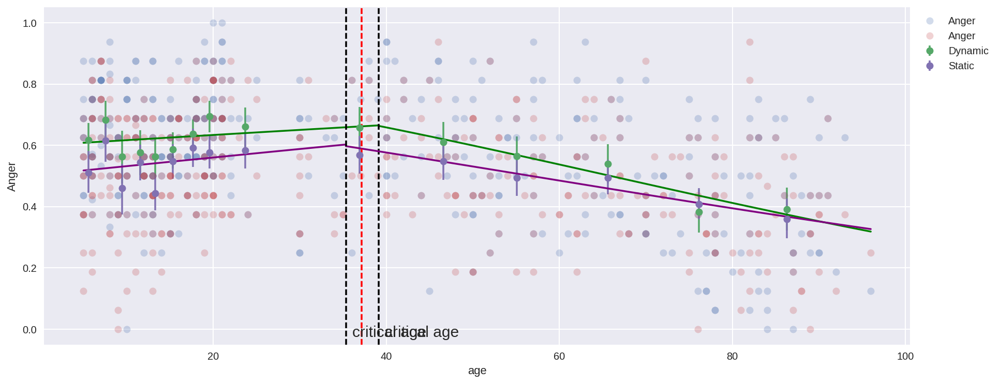

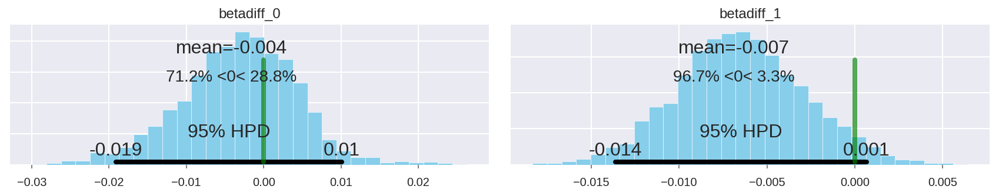

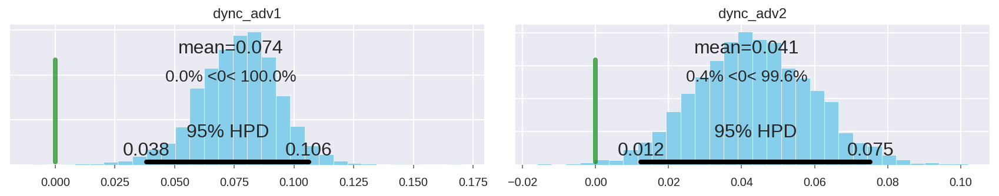

                  mean        sd  mc_error    hpd_2.5   hpd_97.5
tau          37.139155  8.069177  0.170927  21.558581  52.452597
tau1         39.136112  4.050619  0.124482  31.287027  47.764719
tau2         35.328480  6.344179  0.231598  23.008922  45.526520
beta1__0      0.007203  0.004445  0.000146  -0.001912   0.015234
beta1__1     -0.025295  0.002588  0.000058  -0.030299  -0.019934
beta2__0      0.011366  0.006336  0.000249   0.000984   0.024591
beta2__1     -0.018412  0.002731  0.000074  -0.023845  -0.013379
betadiff__0  -0.004163  0.007416  0.000284  -0.019119   0.010083
betadiff__1  -0.006882  0.003657  0.000095  -0.013631   0.000678
dync_adv1     0.073633  0.017045  0.000475   0.038222   0.106222
dync_adv2     0.041406  0.015998  0.000265   0.012440   0.075239


In [32]:
plot_selectposterior(burnin=8000,trace=trace_anger)

### Disgust  

Auto-assigning NUTS sampler...
Initializing NUTS using advi...
Average ELBO = -2,415.1: 100%|██████████| 200000/200000 [01:11<00:00, 2782.90it/s]
Finished [100%]: Average ELBO = -2,414.5
100%|██████████| 10000/10000 [01:18<00:00, 127.71it/s]


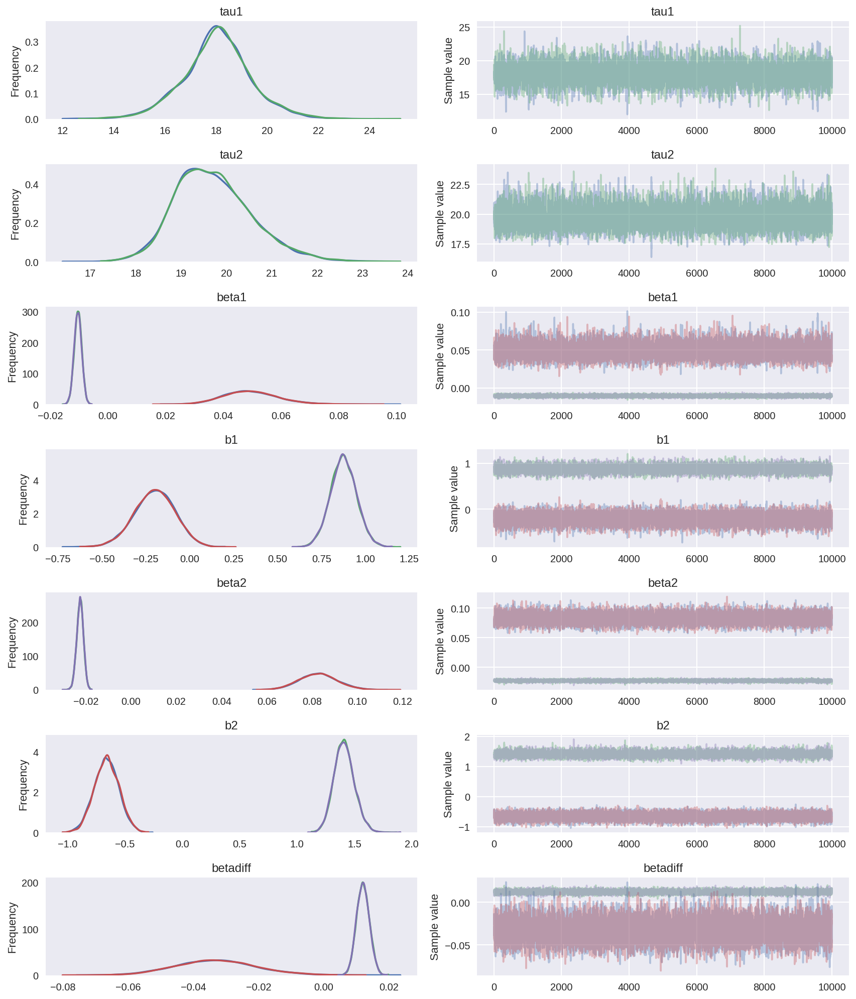

In [33]:
emolabel = 'Disgust'
trace_disgust = model3_diff(emolabel)
pm.traceplot(trace_disgust,varnames=['tau1','tau2','beta1','b1','beta2','b2','betadiff'])
plt.show()

The accept rate is: 0.79978
Diverge of the trace
(array([   35,   375,   549,  3440,  5436,  5847,  7084,  7181, 10005,
       10061, 12022, 12882, 16696]),)


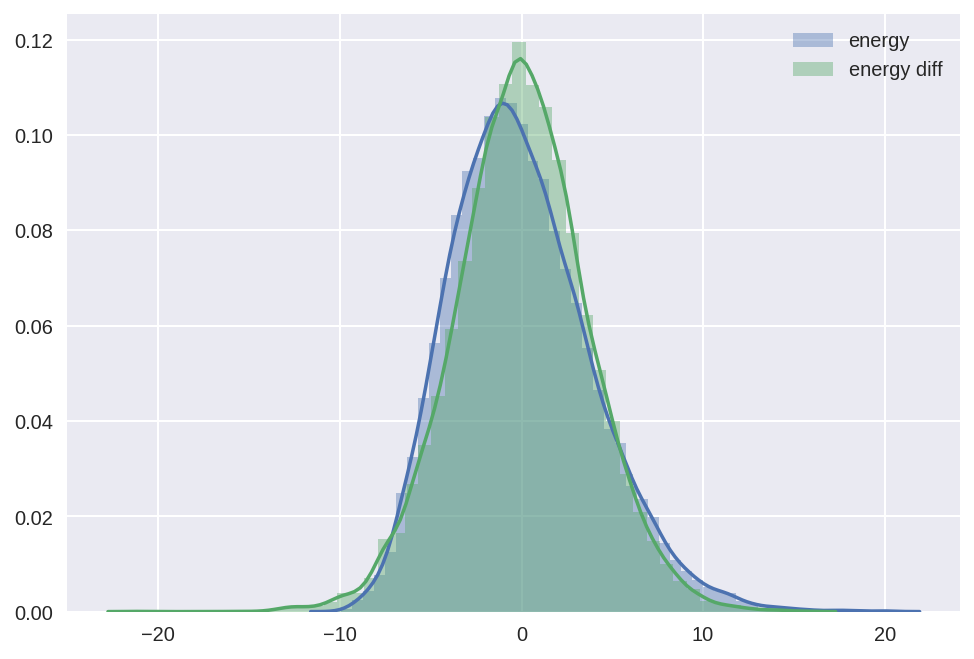

In [34]:
plot_samplerstat(burnin=8000,trace=trace_disgust)

Displaying Dynamic condition
Displaying Static condition


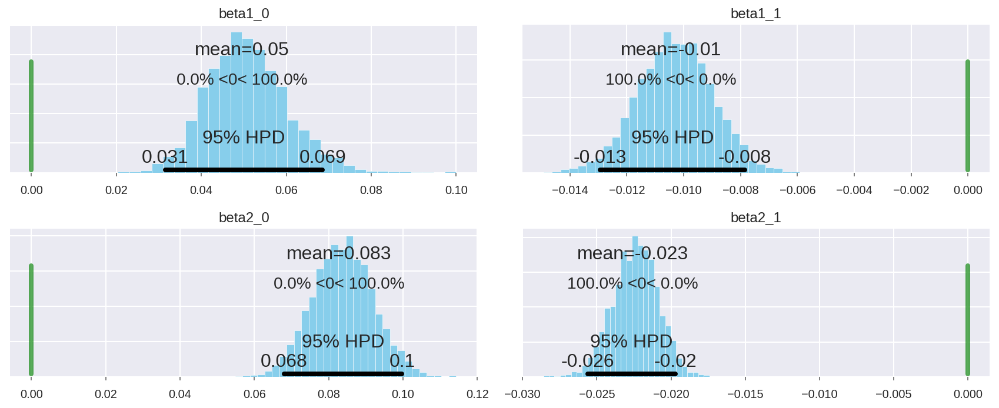

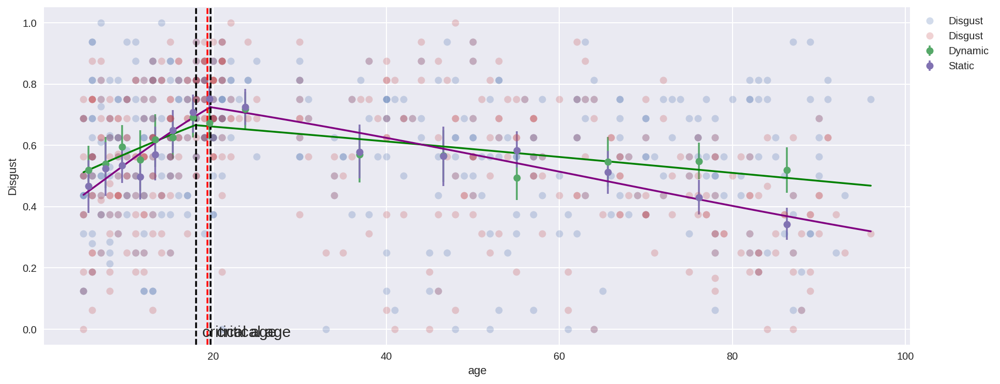

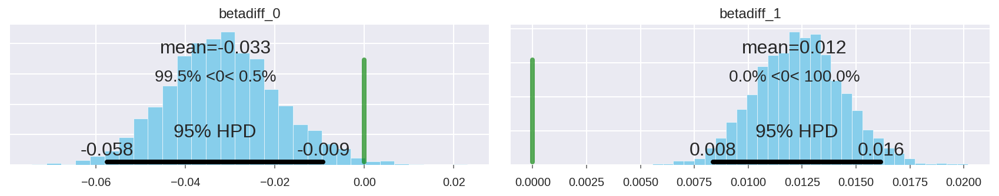

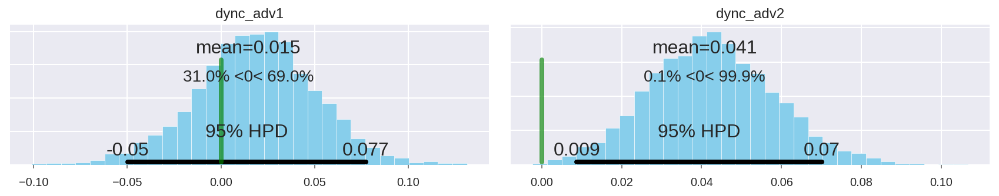

                  mean        sd  mc_error    hpd_2.5   hpd_97.5
tau          19.331669  6.719804  0.120547   5.805800  31.344645
tau1         18.040361  1.310666  0.029880  15.372353  20.571006
tau2         19.703592  0.854265  0.018272  18.149036  21.442167
beta1__0      0.049534  0.009589  0.000210   0.031498   0.068532
beta1__1     -0.010450  0.001310  0.000027  -0.012939  -0.007855
beta2__0      0.082810  0.008142  0.000180   0.067934   0.099746
beta2__1     -0.022585  0.001524  0.000040  -0.025594  -0.019717
betadiff__0  -0.033276  0.012392  0.000269  -0.057543  -0.009195
betadiff__1   0.012135  0.002036  0.000047   0.008367   0.016151
dync_adv1     0.014681  0.032034  0.000584  -0.049806   0.077368
dync_adv2     0.040781  0.015669  0.000224   0.008744   0.070152


In [35]:
plot_selectposterior(burnin=8000,trace=trace_disgust)

### Fear  

Auto-assigning NUTS sampler...
Initializing NUTS using advi...
Average ELBO = -2,112: 100%|██████████| 200000/200000 [01:12<00:00, 2769.59it/s]  
Finished [100%]: Average ELBO = -2,112
100%|██████████| 10000/10000 [01:27<00:00, 114.80it/s]


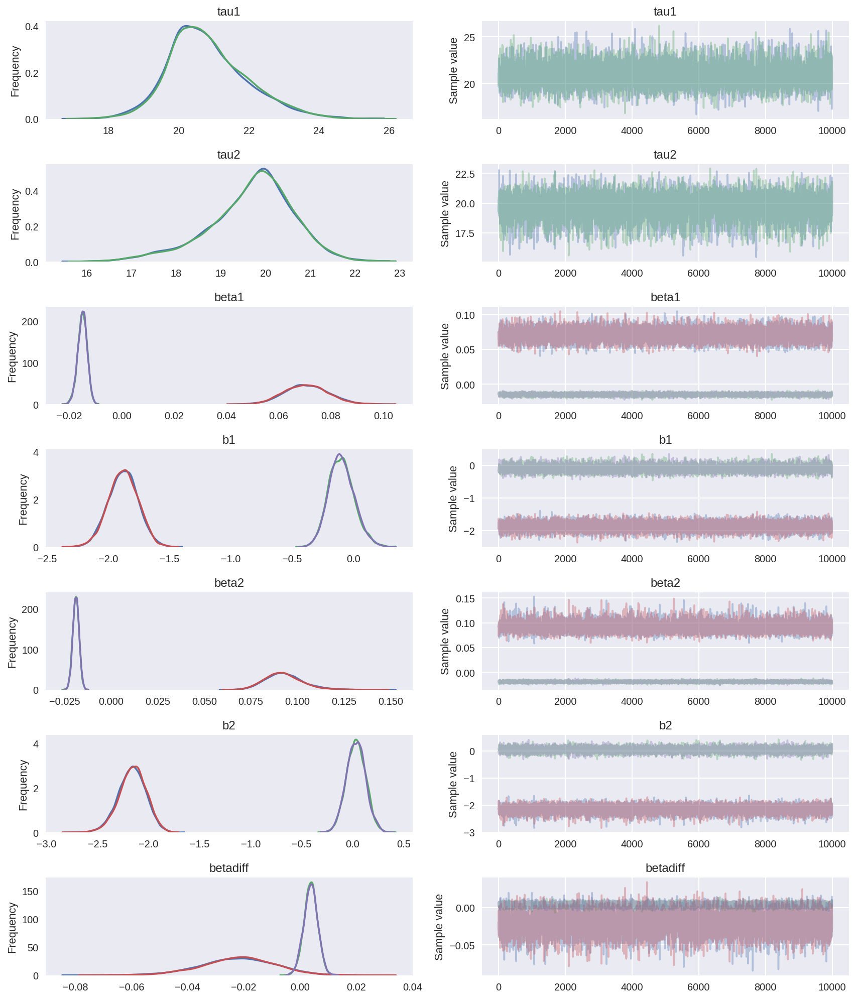

In [36]:
emolabel = 'Fear'
trace_fear = model3_diff(emolabel)
pm.traceplot(trace_fear,varnames=['tau1','tau2','beta1','b1','beta2','b2','betadiff'])
plt.show()

The accept rate is: 0.80017
Diverge of the trace
(array([  135,   423,  1167,  1186,  1582,  3180,  4529, 10178, 10833,
       12348, 12970, 15098, 16337, 17488, 18865]),)


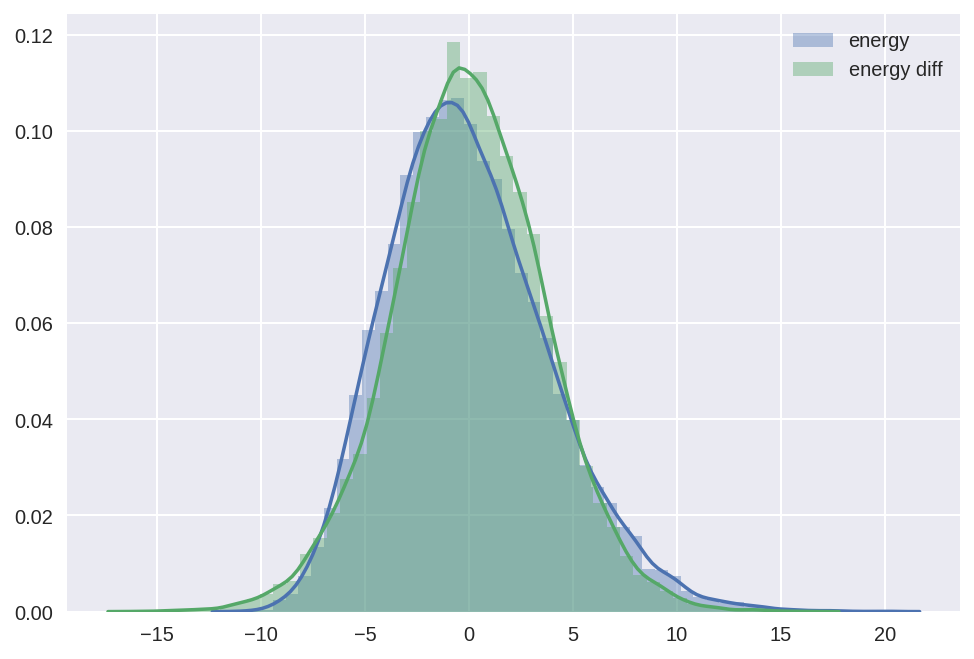

In [37]:
plot_samplerstat(burnin=8000,trace=trace_fear)

Displaying Dynamic condition
Displaying Static condition


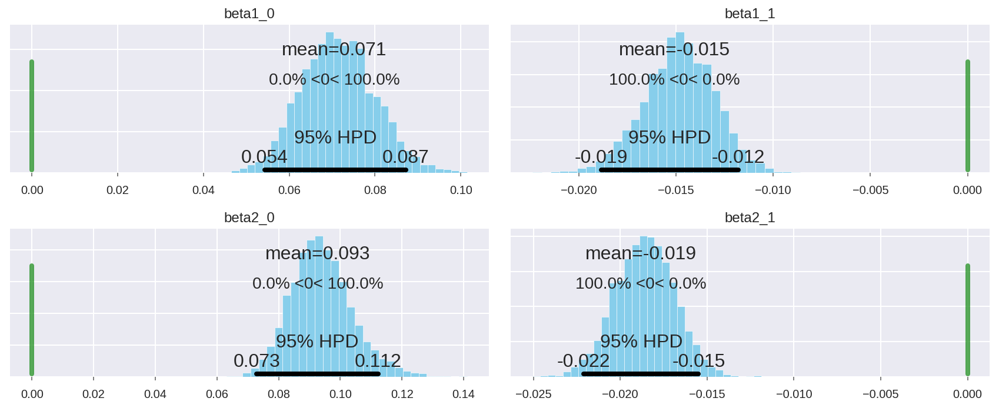

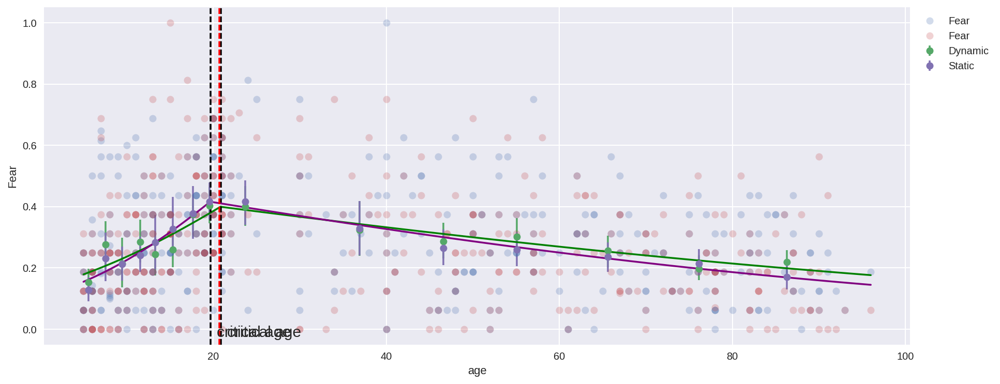

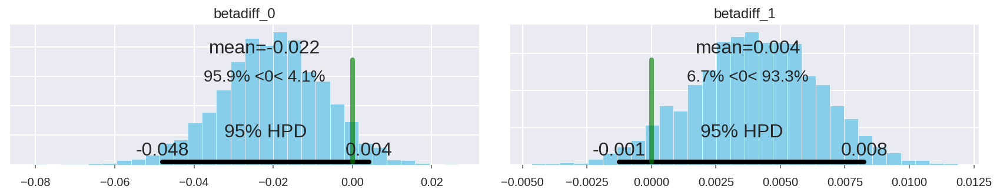

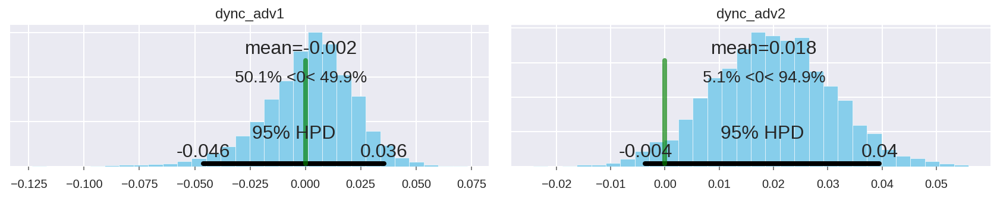

                  mean        sd  mc_error    hpd_2.5   hpd_97.5
tau          20.700652  6.655087  0.106474   6.987025  32.539264
tau1         20.881971  1.163136  0.033534  18.879298  23.452833
tau2         19.696380  0.929222  0.024254  17.609273  21.400246
beta1__0      0.070518  0.008530  0.000189   0.054247   0.087198
beta1__1     -0.015072  0.001811  0.000053  -0.018841  -0.011784
beta2__0      0.092691  0.009989  0.000238   0.072867   0.112349
beta2__1     -0.018815  0.001700  0.000041  -0.022105  -0.015487
betadiff__0  -0.022173  0.013217  0.000296  -0.047950   0.004151
betadiff__1   0.003742  0.002448  0.000066  -0.001244   0.008248
dync_adv1    -0.001906  0.020738  0.000258  -0.046046   0.035573
dync_adv2     0.018300  0.011020  0.000141  -0.003613   0.039520


In [38]:
plot_selectposterior(burnin=8000,trace=trace_fear)

### Happy

Auto-assigning NUTS sampler...
Initializing NUTS using advi...
Average ELBO = -1,449.1: 100%|██████████| 200000/200000 [01:11<00:00, 2805.68it/s]
Finished [100%]: Average ELBO = -1,449.1
100%|██████████| 10000/10000 [02:47<00:00, 59.78it/s]


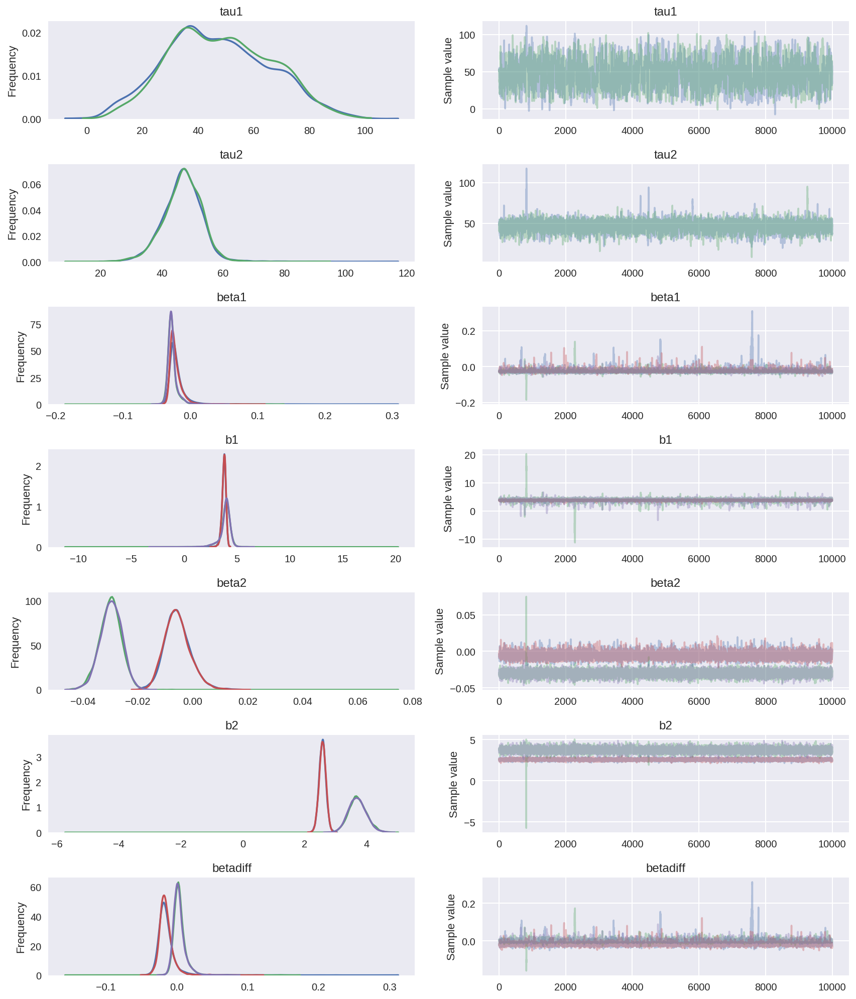

In [39]:
emolabel = 'Happy'
trace_happy = model3_diff(emolabel)
pm.traceplot(trace_happy,varnames=['tau1','tau2','beta1','b1','beta2','b2','betadiff'])
plt.show()

The accept rate is: 0.80006
Diverge of the trace
(array([   33,   203,   362,   426,   471,   815,   979,   986,  1144,
        1546,  1655,  1672,  1693,  1771,  2546,  2657,  3241,  3356,
        3593,  3602,  3834,  3955,  4743,  4809,  4897,  5245,  5346,
        5499,  5804,  5806,  5807,  6027,  6269,  6296,  6472,  6485,
        6763,  6902,  7312,  8241,  8517,  9757,  9868,  9916,  9926,
       10009, 10027, 10455, 10477, 10786, 11130, 11229, 12337, 12637,
       12989, 13435, 13557, 13682, 13707, 13965, 13983, 13985, 14141,
       14452, 14541, 15128, 15393, 15436, 15577, 15677, 15684, 15986,
       16337, 16638, 16865, 17076, 17562, 17645, 17793, 18009, 18360,
       18696, 19161, 19255, 19486, 19532, 19750]),)


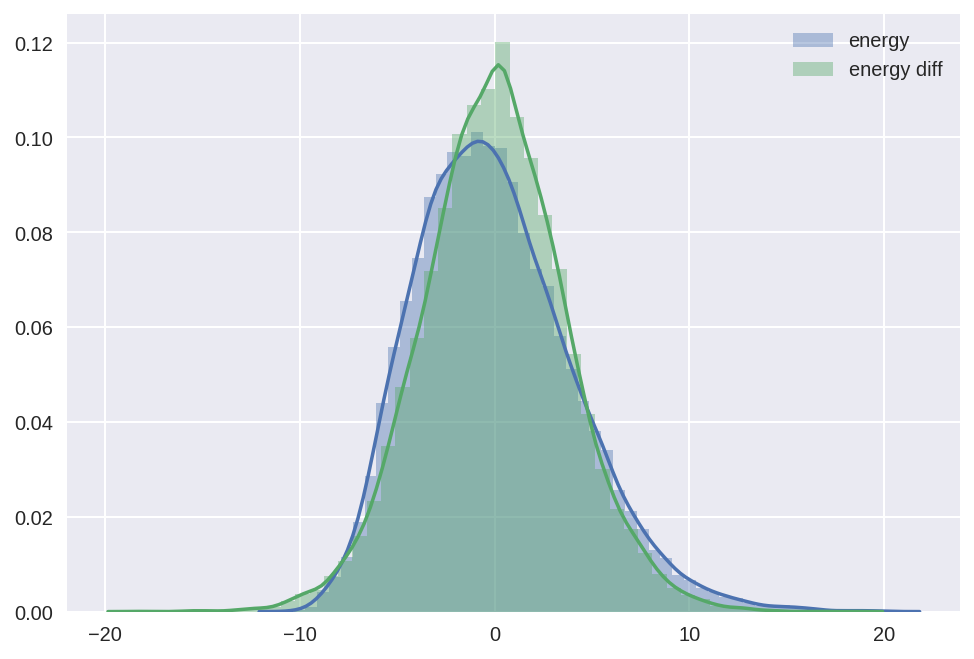

In [40]:
plot_samplerstat(burnin=8000,trace=trace_happy)

Displaying Dynamic condition
Displaying Static condition


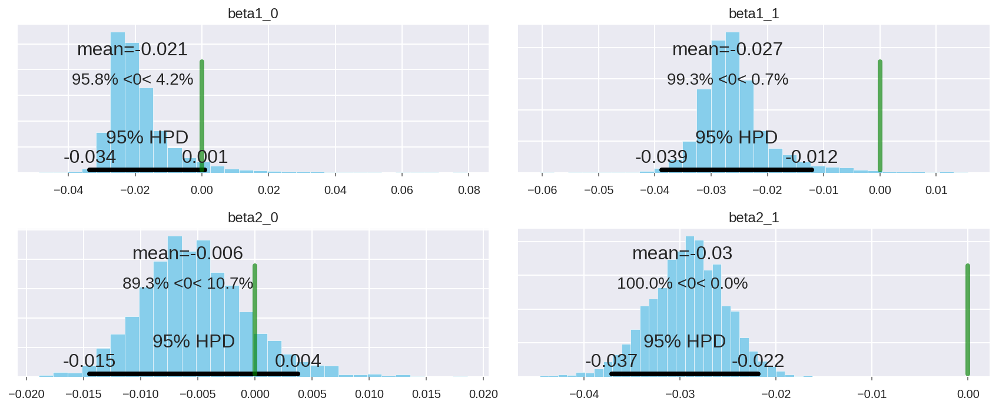

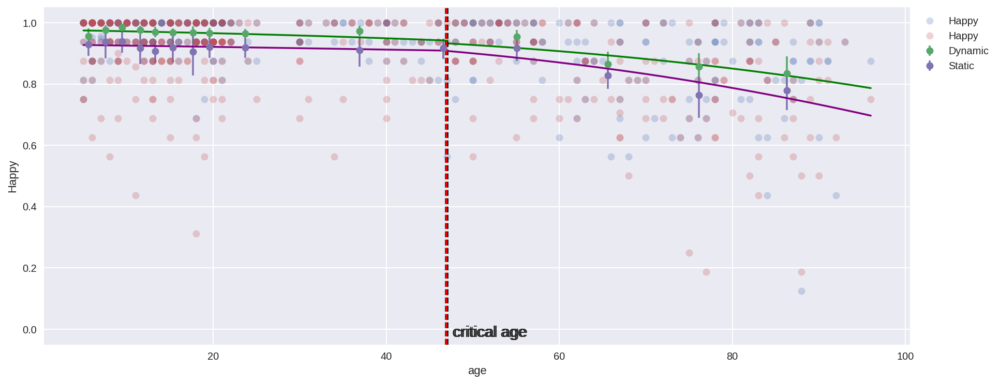

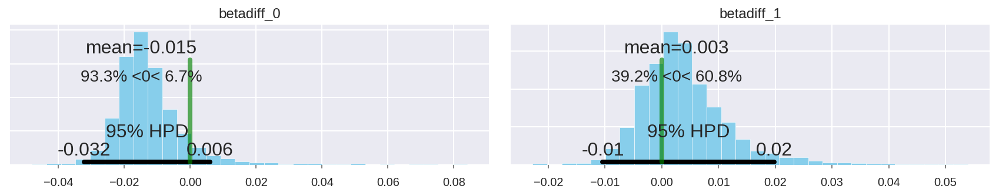

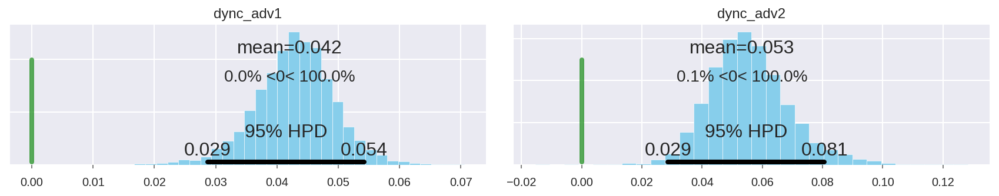

                  mean         sd  mc_error    hpd_2.5   hpd_97.5
tau          46.975950  12.786122  0.560187  22.408537  72.291475
tau1         47.078956  17.708659  0.936946  14.940672  81.848133
tau2         46.877405   6.259417  0.223632  34.494792  57.925163
beta1__0     -0.020702   0.010256  0.000398  -0.033614   0.000903
beta1__1     -0.027044   0.006749  0.000276  -0.038817  -0.012099
beta2__0     -0.005860   0.004688  0.000141  -0.014507   0.003776
beta2__1     -0.029713   0.003893  0.000084  -0.037123  -0.021874
betadiff__0  -0.014843   0.010363  0.000376  -0.032257   0.006017
betadiff__1   0.002669   0.007810  0.000299  -0.010393   0.019789
dync_adv1     0.042026   0.006389  0.000168   0.028649   0.054229
dync_adv2     0.053235   0.013389  0.000308   0.028659   0.080647


In [41]:
plot_selectposterior(burnin=8000,trace=trace_happy)

### Sad

Auto-assigning NUTS sampler...
Initializing NUTS using advi...
Average ELBO = -2,290.8: 100%|██████████| 200000/200000 [01:10<00:00, 2824.33it/s]
Finished [100%]: Average ELBO = -2,289.9
100%|██████████| 10000/10000 [01:43<00:00, 96.94it/s]


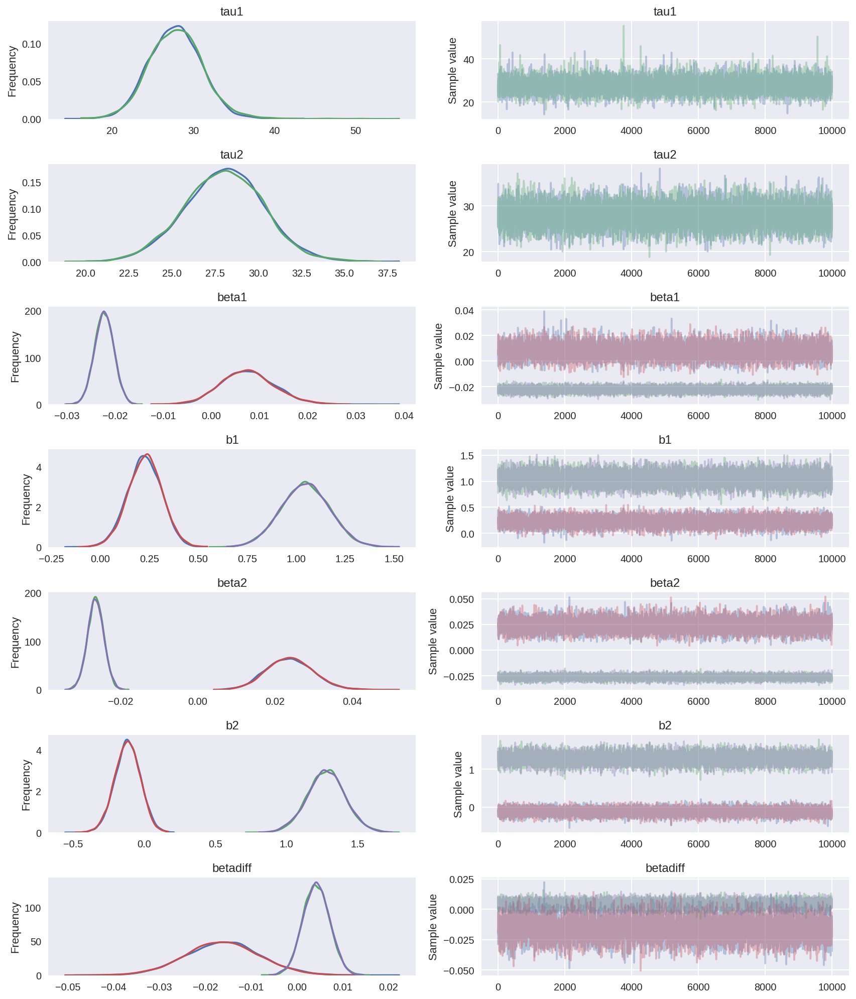

In [42]:
emolabel = 'Sad'
trace_sad = model3_diff(emolabel)
pm.traceplot(trace_sad,varnames=['tau1','tau2','beta1','b1','beta2','b2','betadiff'])
plt.show()

The accept rate is: 0.79950
Diverge of the trace
(array([  109,   898,  1236,  1385,  2638,  2776,  3349,  5939, 10126,
       10204, 10765, 12092, 12887, 14149, 17321, 17945, 18630, 19663]),)


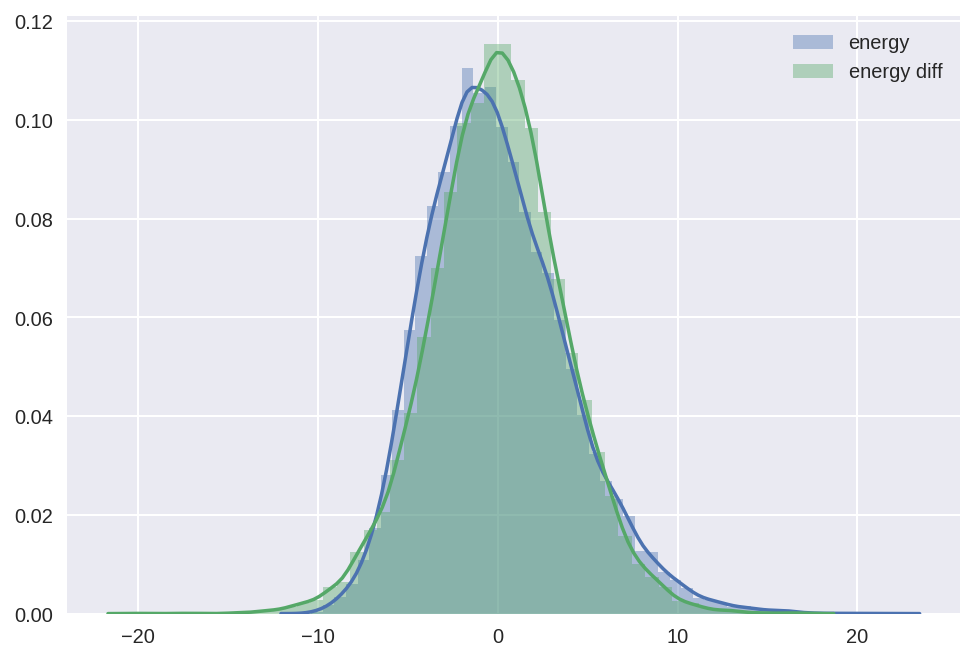

In [43]:
plot_samplerstat(burnin=8000,trace=trace_sad)

Displaying Dynamic condition
Displaying Static condition


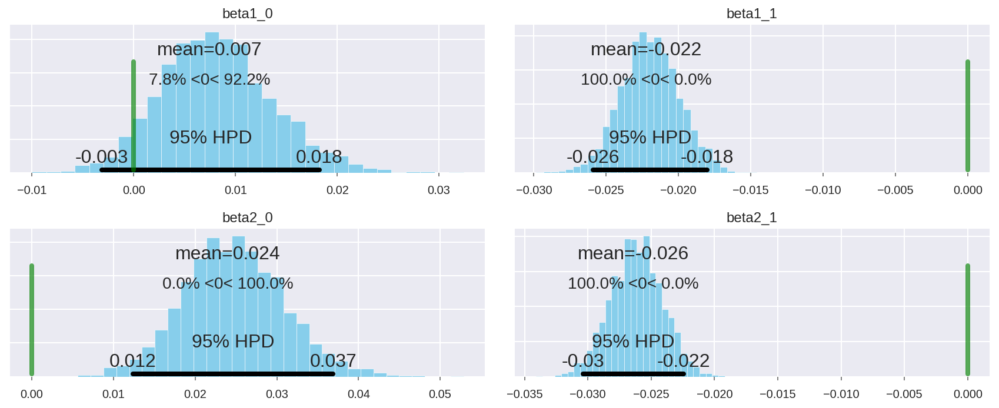

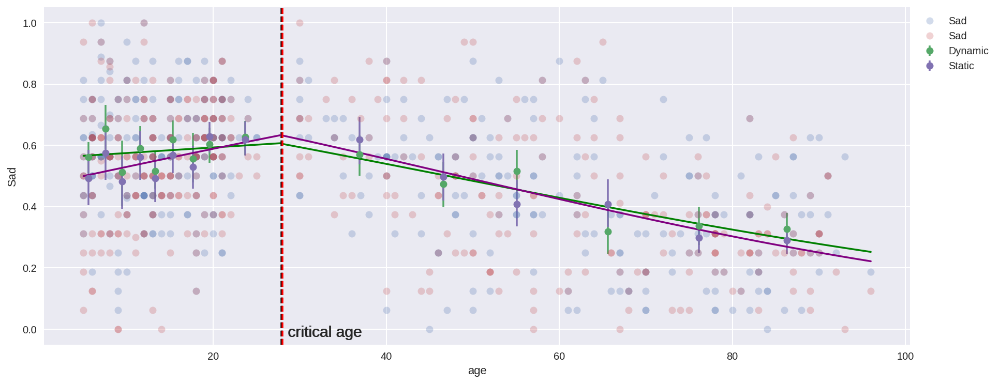

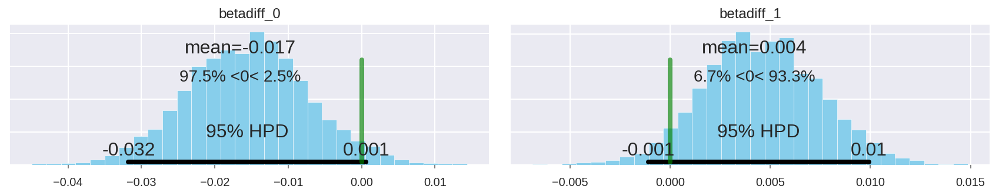

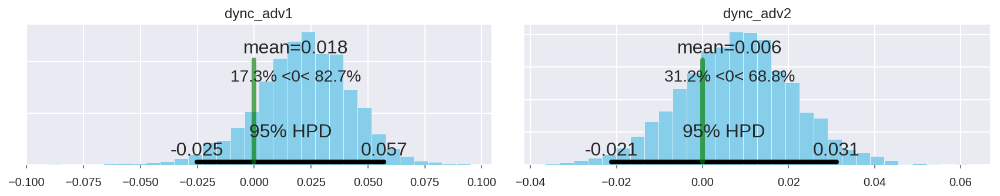

                  mean        sd  mc_error    hpd_2.5   hpd_97.5
tau          27.992987  7.243496  0.133223  13.821129  41.502291
tau1         27.857769  3.333199  0.086532  21.480663  34.169058
tau2         27.953016  2.270359  0.052137  23.147279  32.044550
beta1__0      0.007450  0.005447  0.000139  -0.003134   0.018254
beta1__1     -0.022221  0.002007  0.000040  -0.025896  -0.018021
beta2__0      0.023978  0.006187  0.000151   0.012387   0.036899
beta2__1     -0.026424  0.002047  0.000049  -0.030389  -0.022426
betadiff__0  -0.016528  0.008259  0.000214  -0.031766   0.000630
betadiff__1   0.004202  0.002874  0.000064  -0.001096   0.009931
dync_adv1     0.018306  0.020972  0.000391  -0.025200   0.057080
dync_adv2     0.006341  0.013215  0.000201  -0.021169   0.031166


In [44]:
plot_selectposterior(burnin=8000,trace=trace_sad)

### Surprise

Auto-assigning NUTS sampler...
Initializing NUTS using advi...
Average ELBO = -2,312.6: 100%|██████████| 200000/200000 [01:13<00:00, 2735.29it/s]
Finished [100%]: Average ELBO = -2,312.5
100%|██████████| 10000/10000 [01:50<00:00, 91.31it/s]


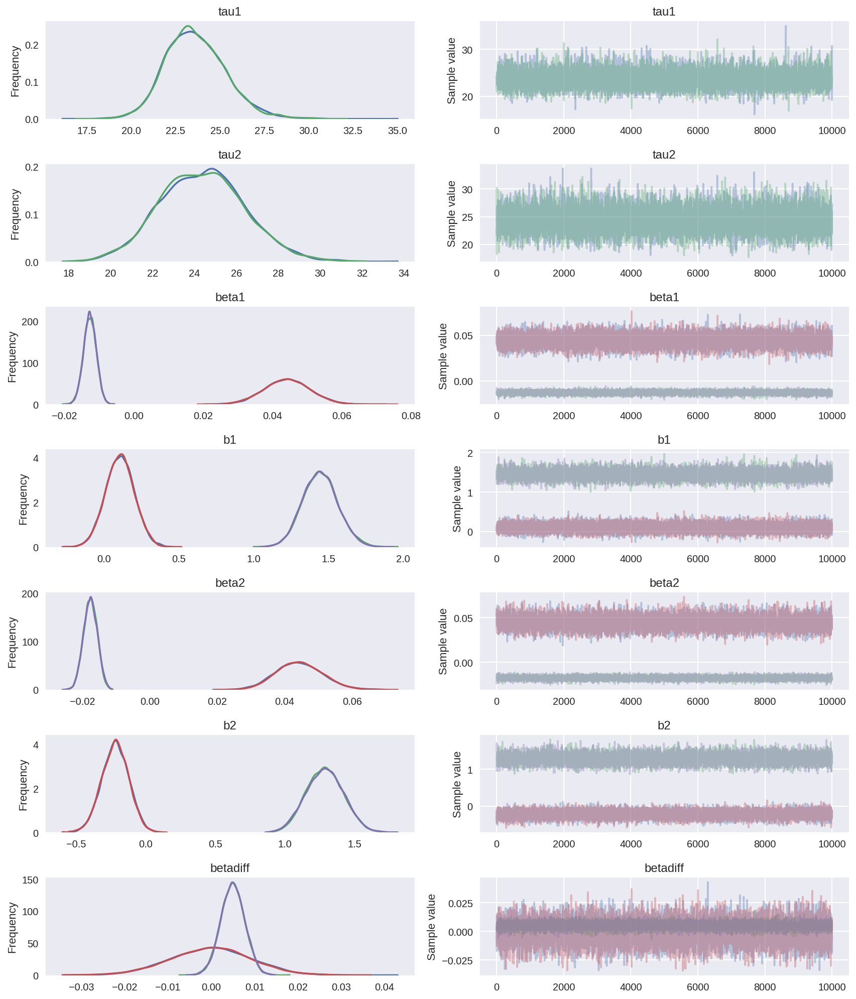

In [45]:
emolabel = 'Surprise'
trace_surprise = model3_diff(emolabel)
pm.traceplot(trace_surprise,varnames=['tau1','tau2','beta1','b1','beta2','b2','betadiff'])
plt.show()

The accept rate is: 0.80000
Diverge of the trace
(array([    1,    27,    41,  1889,  2016,  4521,  7839,  7974,  7983,
        8556, 10030, 10215, 10290, 10450, 15281, 16001, 18116, 18548]),)


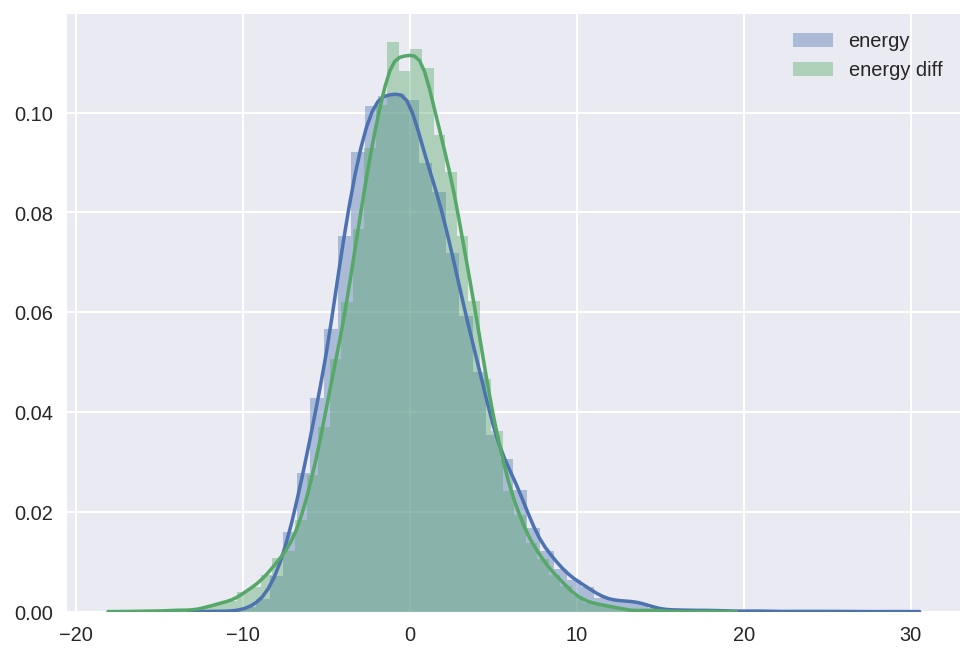

In [46]:
plot_samplerstat(burnin=8000,trace=trace_surprise)

Displaying Dynamic condition
Displaying Static condition


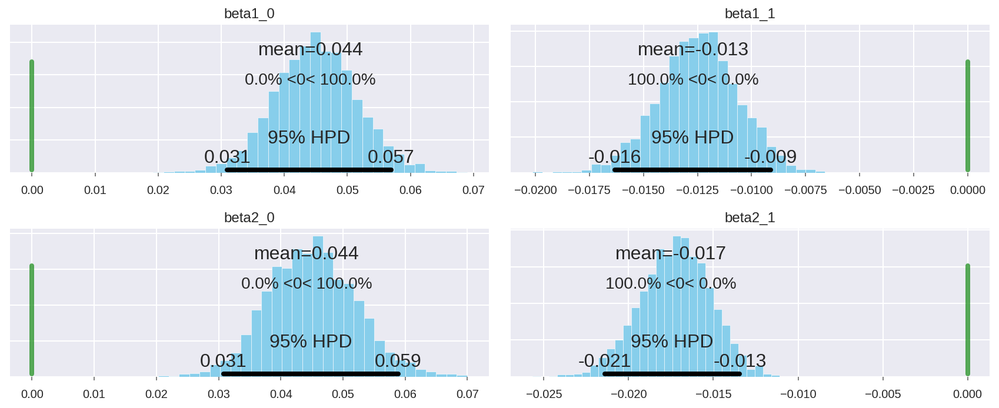

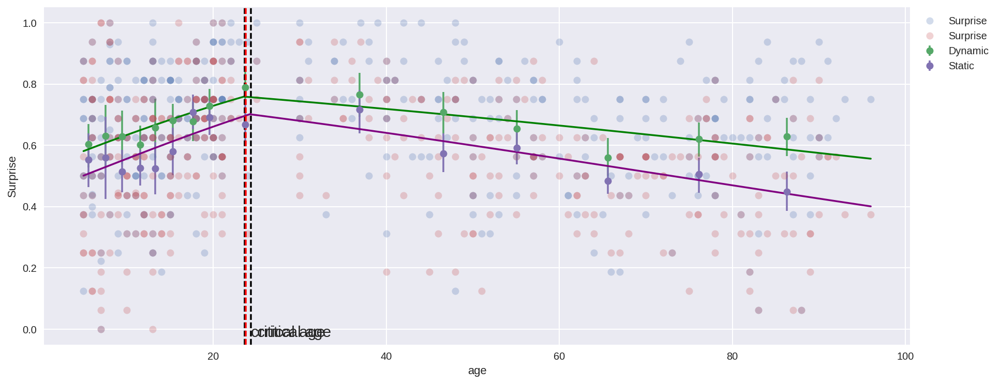

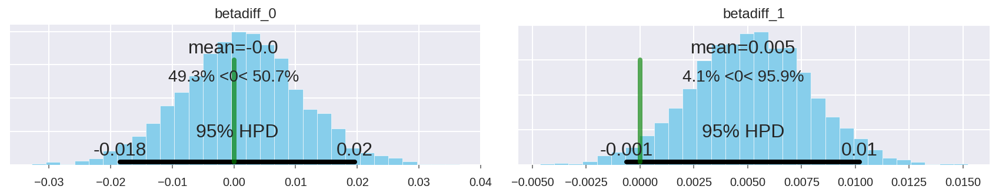

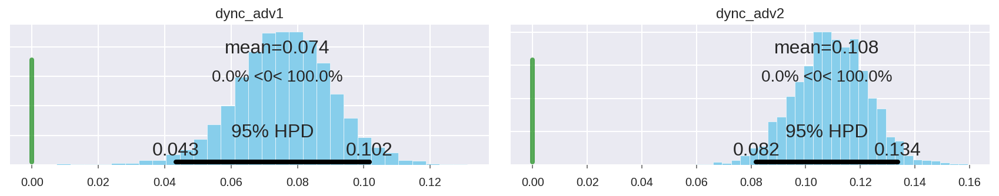

                  mean        sd  mc_error    hpd_2.5   hpd_97.5
tau          23.774558  7.271254  0.132729   9.586336  37.699138
tau1         23.622090  1.696438  0.041614  20.492255  26.905559
tau2         24.340244  2.074956  0.057651  20.185571  28.193580
beta1__0      0.044152  0.006570  0.000139   0.030943   0.056906
beta1__1     -0.012697  0.001849  0.000046  -0.016336  -0.009107
beta2__0      0.044194  0.007130  0.000181   0.030780   0.058873
beta2__1     -0.017498  0.002053  0.000054  -0.021409  -0.013441
betadiff__0  -0.000042  0.009647  0.000224  -0.018465   0.019584
betadiff__1   0.004801  0.002759  0.000068  -0.000623   0.010196
dync_adv1     0.073889  0.014668  0.000226   0.043327   0.101645
dync_adv2     0.107642  0.013398  0.000220   0.081847   0.133683


In [47]:
plot_selectposterior(burnin=8000,trace=trace_surprise)

### Frequentist fit
Following the receipt recommended by [Uri Simonsohn](http://urisohn.com/sohn_files/BlogAppendix/Colada27/Step-by-step%202%20lines.html)

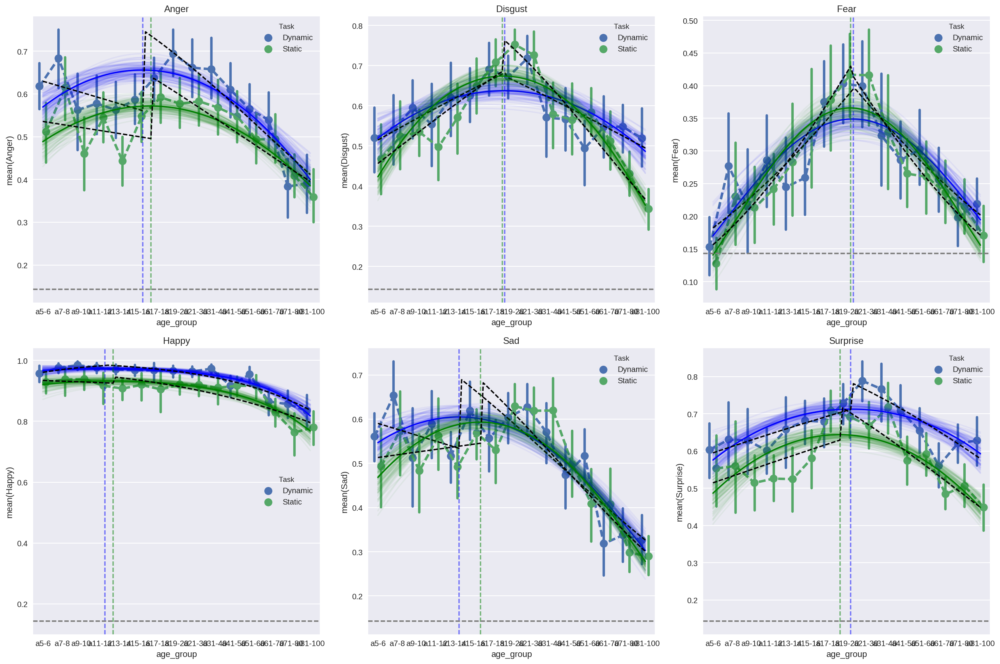

In [20]:
import statsmodels.api as sm

idx = (datatbl_123['Task']!='Shuffled')
dftmp = pd.DataFrame.copy(datatbl_123.loc[idx])

plt.figure(figsize=(18,12))
def exog_func1(X):
    X1tmp = np.asarray(X)/100
    exog  = np.concatenate((np.expand_dims(X1tmp, axis=1),np.expand_dims(X1tmp**2, axis=1)),axis=1)
    exog  = sm.add_constant(exog, prepend=False)
    return exog

def exog_func2(X,breakpoint):
    highvec = np.asarray(X>breakpoint)
    X1tmp = np.asarray(X)/100
    exogbk  = np.concatenate((np.expand_dims(X1tmp*highvec, axis=1),
                              np.expand_dims(X1tmp*(1-highvec), axis=1),
                              np.expand_dims(highvec, axis=1),),axis=1)
    exogbk = sm.add_constant(exogbk, prepend=False)
    return exogbk
# emolabel = 'Disgust'

betamat = np.zeros((len(exp_list),6,3))
for ic, emolabel in enumerate(exp_list):
    ax = plt.subplot(2,3,ic+1)
    
    # sns.stripplot(x="age_group", y=emolabel, data=dftmp, hue='Task',jitter=True, alpha=.5,ax=ax);
    sns.pointplot(x="age_group", y=emolabel, data=dftmp, hue='Task',
                  dodge=.35,linestyles='--',estimator=np.mean, ci=95, n_boot=1000, ax=ax);
    Nrs = 100
    count = 0 
    for cc,itask in zip(['b','g'],['Dynamic','Static']):
        X1,Y1,T1 = getdata(itask,emolabel,agevec='age_group2')
        # X2,Y2,T2 = getdata('Static',emolabel)
        agemin = X1.min()
        agemax = X1.max()
        endog = np.concatenate((np.expand_dims(Y1, axis=1),np.expand_dims(T1-Y1, axis=1)),axis=1)
        exog  = exog_func1(X1)

        glm_binom = sm.GLM(endog, exog, family=sm.families.Binomial())
        res = glm_binom.fit()
        # print(res.summary())
        # save betas
        betamat[ic,count,0]  = res.params[-1]
        betamat[ic,count,1:] = res.conf_int()[-1]
        count += 1
        
        Xtmp= np.linspace(agemin,agemax,100)
        exog1 = exog_func1(Xtmp)
        Yhat  = res.predict(exog1)
        ax.plot(Xtmp,Yhat,color=cc)
        breakpoint = Xtmp[Yhat.argmax()]
        ax.axvline(breakpoint,linestyle='--', color=cc, alpha=.5)
        
        for ik in range(Nrs):
            resamp = np.random.choice(len(X1),len(X1))
            glm_binom1 = sm.GLM(endog[resamp], exog[resamp], family=sm.families.Binomial())
            res1 = glm_binom1.fit()
            Yhat1 = res1.predict(exog1)
            ax.plot(Xtmp,Yhat1,color=cc,alpha=.05)
        ax.axhline(1/7,linestyle='--', color='gray')
        plt.title(emolabel)
        
        exogbk = exog_func2(X1,breakpoint)
        glm_binom_bk = sm.GLM(endog, exogbk, family=sm.families.Binomial())
        res_bk = glm_binom_bk.fit()
        # save betas
        betamat[ic,count,0]  = res_bk.params[0]
        betamat[ic,count,1:] = res_bk.conf_int()[0]
        count += 1
        
        betamat[ic,count,0]  = res_bk.params[1]
        betamat[ic,count,1:] = res_bk.conf_int()[1]
        count += 1
        
        exogbk1 = exog_func2(Xtmp,breakpoint)
        Yhatbk  = res_bk.predict(exogbk1)
        ax.plot(Xtmp,Yhatbk,'--k')
        
plt.tight_layout()
plt.show()

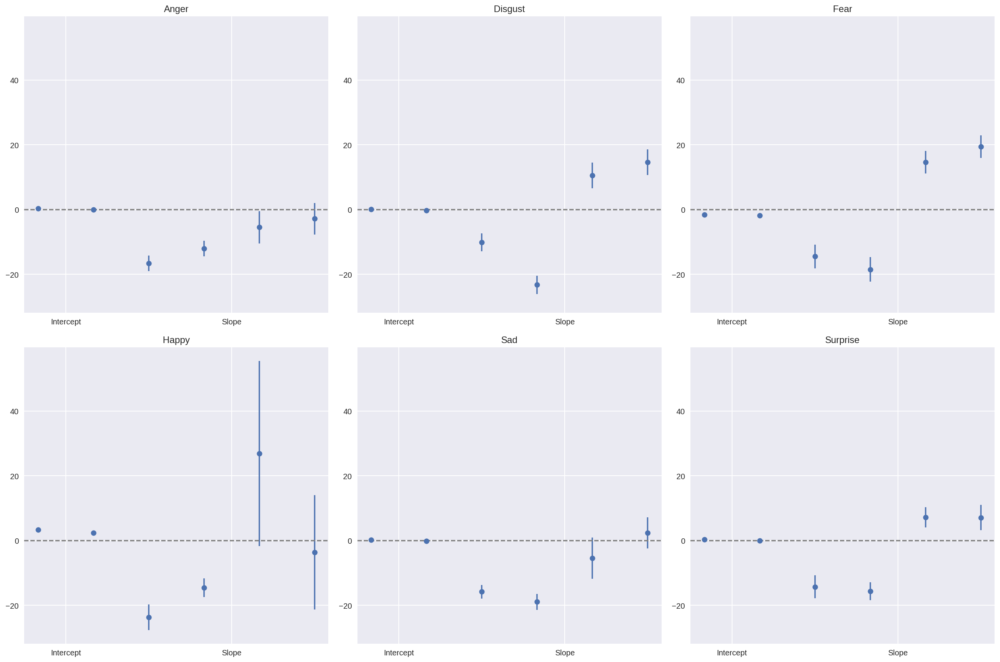

In [22]:
plt.figure(figsize=(18,12))

xbar=np.asarray([1,3,5,2,4,6])
ax = plt.subplot(2,3,1)
for ic, emolabel in enumerate(exp_list):
    ax = plt.subplot(2,3,ic+1,sharey=ax)
    
    ybar=np.copy(betamat[ic,:,0])
    y_ci=np.copy(betamat[ic,:,1:])
    y_ci[:,0]=ybar-y_ci[:,0]
    y_ci[:,1]=y_ci[:,1]-ybar
    ax.errorbar(xbar, ybar, yerr=y_ci.transpose(), fmt='o')
    ax.set_xticks([1.5, 4.5])
    ax.set_xticklabels(['Intercept', 'Slope'])
    plt.title(emolabel)
    ax.axhline(0,linestyle='--', color='gray')
    
plt.tight_layout()
plt.show()